In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df_names = ['train_features', 'train_targets_scored', 'train_targets_nonscored']

df = {}
for name in df_names:
    df[name] = pd.read_csv(f"{name}.csv", index_col=0)
    print(f"{name}: {df[name].shape}")

train_features: (23814, 875)
train_targets_scored: (23814, 206)
train_targets_nonscored: (23814, 402)


In [3]:
df_full = pd.concat([df['train_features'], df['train_targets_scored'].add_prefix('scored_'), df['train_targets_nonscored'].add_prefix('nonscored_')], axis=1)
df_full['count_scored'] = df_full.filter(regex='^scored_').sum(axis=1)
df_full['count_nonscored'] = df_full.filter(regex='^nonscored_').sum(axis=1)
df_full['count_total'] = df_full['count_scored'] + df_full['count_nonscored']

In [4]:
df_full[df_full['cp_type'] == 'trt_cp']['count_total'].value_counts()

1     15636
0      3664
2      2057
3       450
4        74
6        19
7        18
5        18
11        6
10        6
Name: count_total, dtype: int64

In [5]:
target_sorted = df_full.filter(regex='^scored_').sum(axis=0).sort_values(ascending=False)
target_sorted.head(50)

scored_nfkb_inhibitor                             832
scored_proteasome_inhibitor                       726
scored_cyclooxygenase_inhibitor                   435
scored_dopamine_receptor_antagonist               424
scored_serotonin_receptor_antagonist              404
scored_dna_inhibitor                              402
scored_glutamate_receptor_antagonist              367
scored_adrenergic_receptor_antagonist             360
scored_cdk_inhibitor                              340
scored_egfr_inhibitor                             336
scored_tubulin_inhibitor                          316
scored_acetylcholine_receptor_antagonist          301
scored_pdgfr_inhibitor                            297
scored_hmgcr_inhibitor                            283
scored_calcium_channel_blocker                    281
scored_flt3_inhibitor                             279
scored_kit_inhibitor                              273
scored_adrenergic_receptor_agonist                270
scored_sodium_channel_inhibi

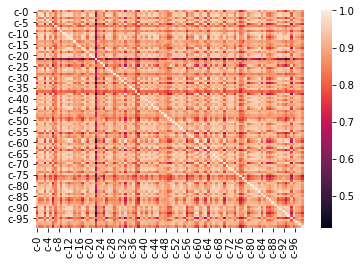

In [6]:
sns.heatmap(df_full[df_full['scored_nfkb_inhibitor'] == 1].filter(regex='^c-').corr())

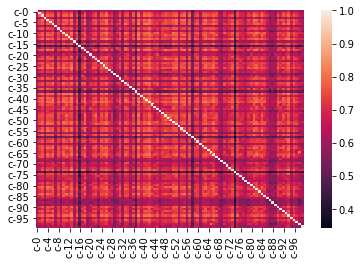

In [7]:
sns.heatmap(df_full[df_full['scored_nfkb_inhibitor'] == 0].filter(regex='^c-').corr())

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


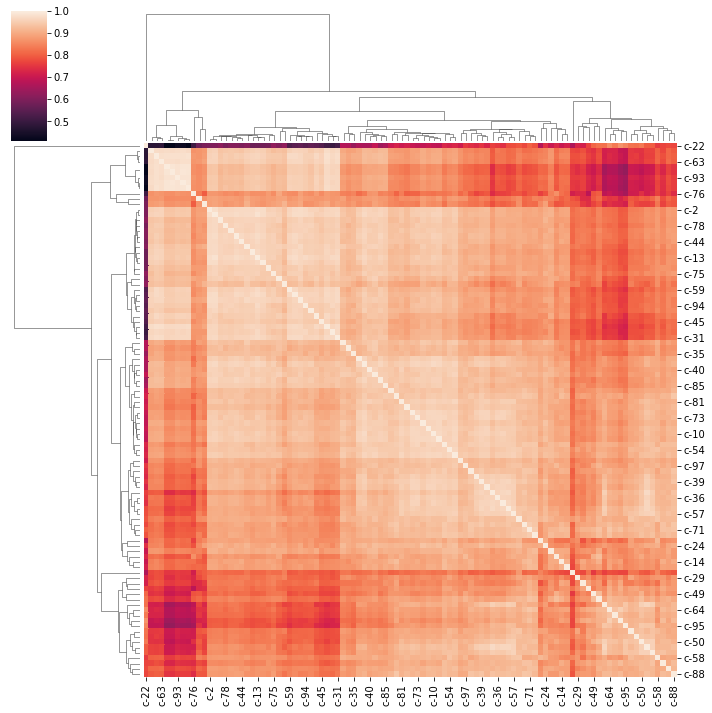

In [8]:
sns.clustermap(df_full[df_full['scored_nfkb_inhibitor'] == 1].filter(regex='^(c)-').corr())

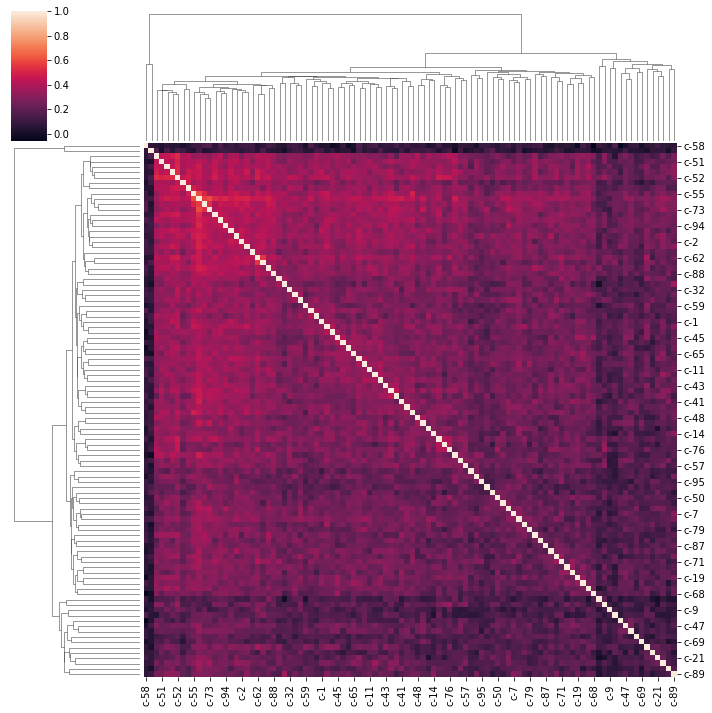

In [9]:
sns.clustermap(df_full[df_full['scored_dopamine_receptor_antagonist'] == 1].filter(regex='^(c)-').corr())

In [10]:
df_full.filter(regex='^cp')

,cp_type,cp_time,cp_dose
sig_id,,,
id_000644bb2,trt_cp,24,D1
id_000779bfc,trt_cp,72,D1
id_000a6266a,trt_cp,48,D1
id_0015fd391,trt_cp,48,D1
id_001626bd3,trt_cp,72,D2
...,...,...,...
id_fffb1ceed,trt_cp,24,D2
id_fffb70c0c,trt_cp,24,D2
id_fffc1c3f4,ctl_vehicle,48,D2


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


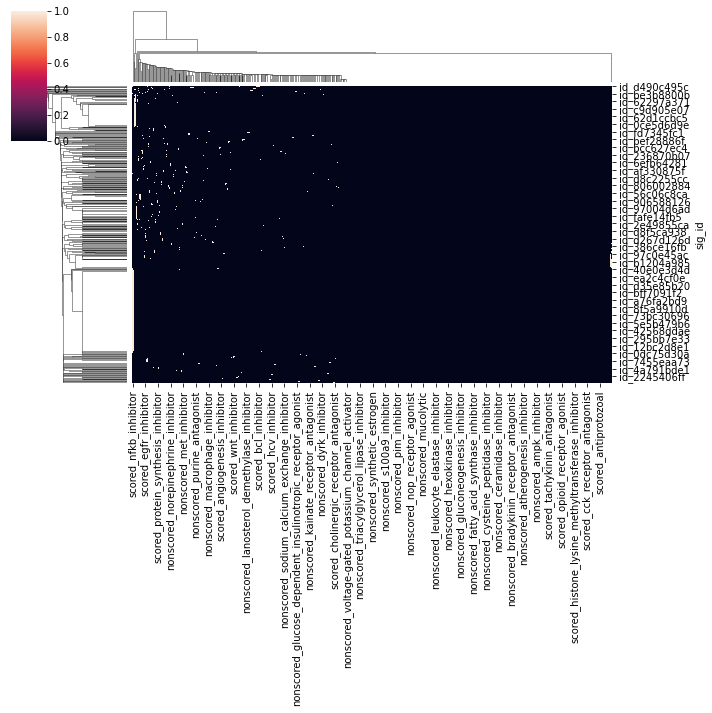

In [11]:
sns.clustermap(df_full[df_full['count_total'] > 1].filter(regex='^(scored|nonscored)_'))

In [12]:
df_sum = df_full.filter(regex='^(scored|nonscored)_').sum(axis=0)
df_sum = df_sum[df_sum == 0]
print(df_sum.index)

Index(['nonscored_adenosine_deaminase_inhibitor',
       'nonscored_alpha_mannosidase_inhibitor', 'nonscored_antihypertensive',
       'nonscored_antimetabolite',
       'nonscored_apolipoprotein_expression_enhancer',
       'nonscored_atp_channel_activator',
       'nonscored_biliverdin_reductase_a_activator',
       'nonscored_calpain_inhibitor', 'nonscored_car_agonist',
       'nonscored_carboxylesterase_inhibitor', 'nonscored_cardiac_glycoside',
       'nonscored_cell_proliferation_inhibitor',
       'nonscored_cftr_channel_antagonist', 'nonscored_collagenase_inhibitor',
       'nonscored_collapsin_response_mediator_protein_stimulant',
       'nonscored_coloring_agent', 'nonscored_complement_antagonist',
       'nonscored_complement_inhibitor',
       'nonscored_cysteine_peptidase_inhibitor',
       'nonscored_deubiquitinase_inhibitor',
       'nonscored_dna_repair_enzyme_inhibitor',
       'nonscored_dystrophin_stimulant', 'nonscored_etv1_inhibitor',
       'nonscored_free_fatty_a

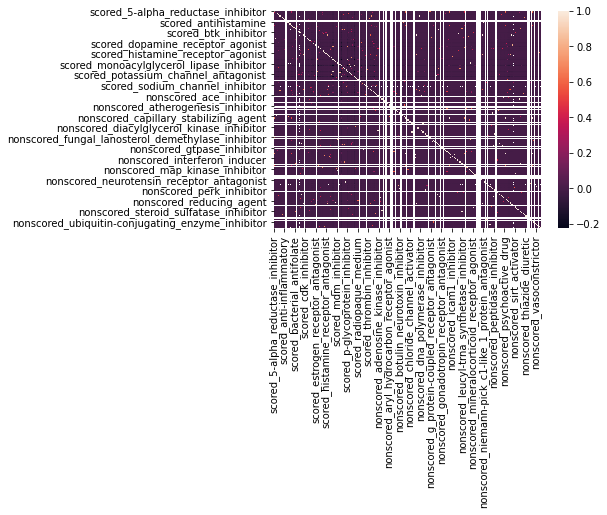

In [13]:
sns.heatmap(df_full.loc[df_full['count_total'] > 1, (df_full != 0).any(axis=0)].filter(regex='^(scored|nonscored)_').corr())

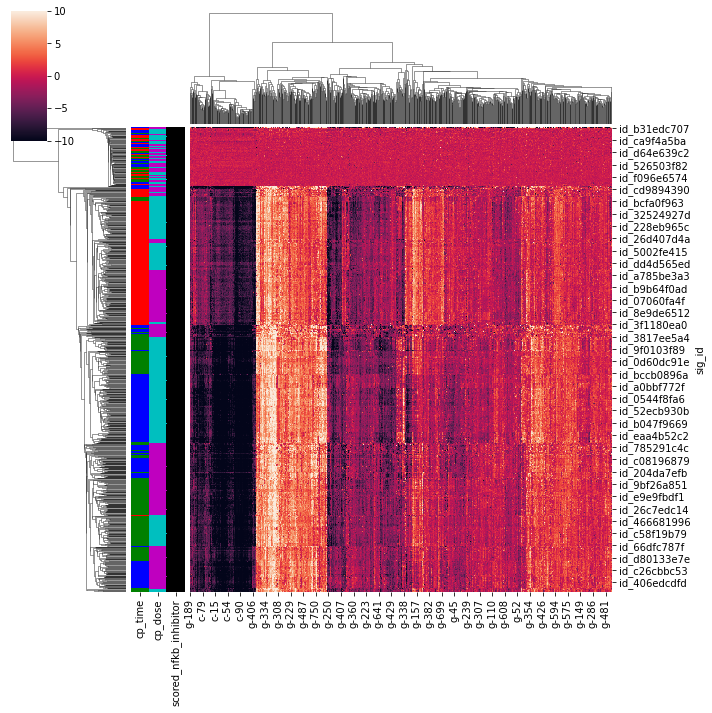

In [18]:
def plot_clustermap(df, tar):
    df_feature = df[df[tar] == 1].filter(regex='^(c|g)-')
    df_color = pd.DataFrame({'cp_time': df[df[tar] == 1]['cp_time'].map({24: 'r', 48: 'g', 72: 'b'}), 
                             'cp_dose': df[df[tar] == 1]['cp_dose'].map({'D1': 'c', 'D2': 'm'}), 
                             tar: df[df[tar] == 1][tar].map({0: 'w', 1: 'k'})})
    sns.clustermap(df_feature, row_colors=df_color)

plot_clustermap(df_full, 'scored_nfkb_inhibitor')

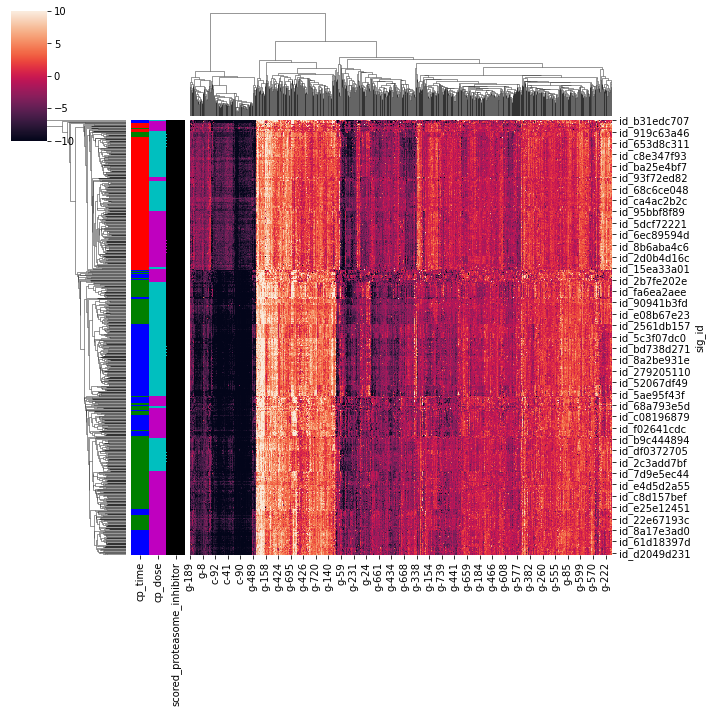

In [19]:
plot_clustermap(df_full, 'scored_proteasome_inhibitor')

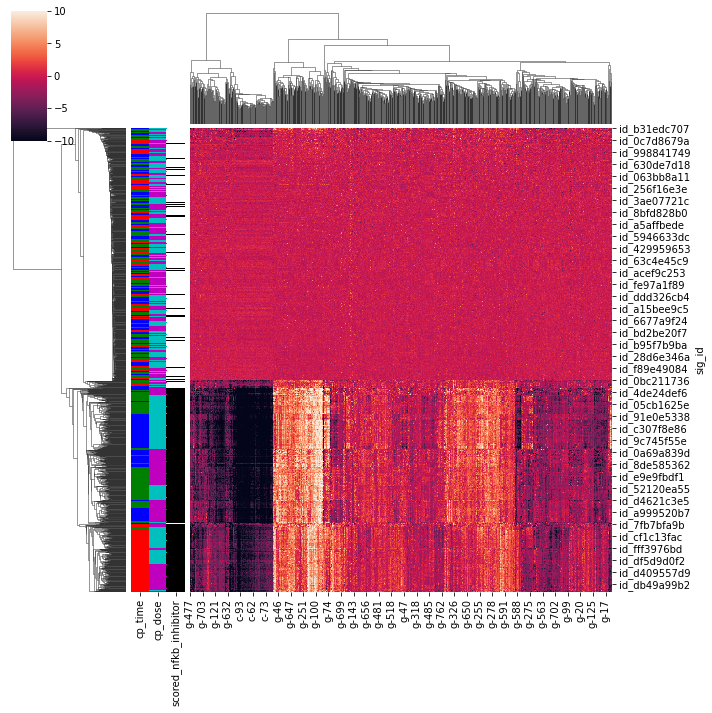

In [14]:
def plot_clustermap_compare(df, tar):
    df_sample = df[df[tar] == 1]
    df_sample = pd.concat([df_sample, df[(df['cp_type'] == 'trt_cp') & (df[tar] == 0)].sample(df_sample.shape[0], random_state=2020)], axis=0)
    
    df_feature = df_sample.filter(regex='^(c|g)-')
    df_color = pd.DataFrame({'cp_time': df_sample['cp_time'].map({24: 'r', 48: 'g', 72: 'b'}), 
                             'cp_dose': df_sample['cp_dose'].map({'D1': 'c', 'D2': 'm'}), 
                             tar: df_sample[tar].map({0: 'w', 1: 'k'})})
    sns.clustermap(df_feature, row_colors=df_color)

plot_clustermap_compare(df_full, 'scored_nfkb_inhibitor')

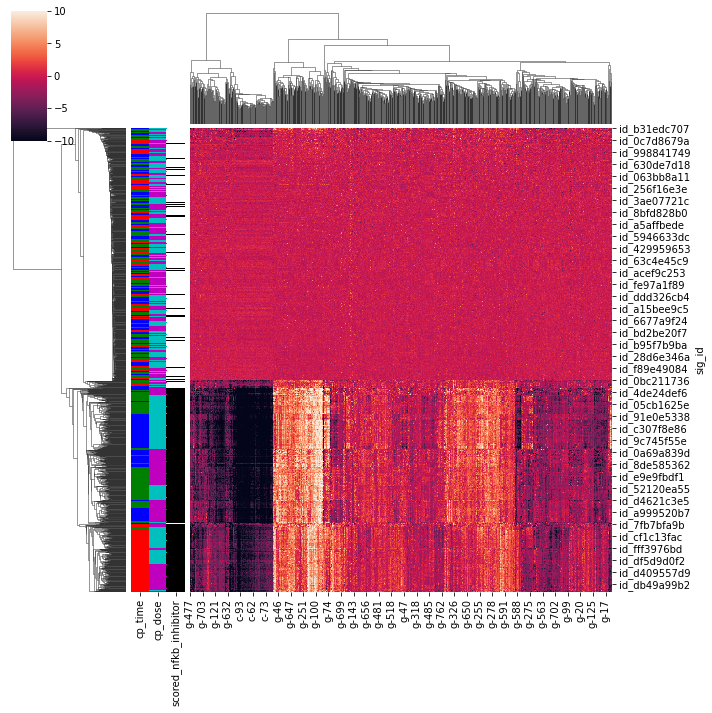

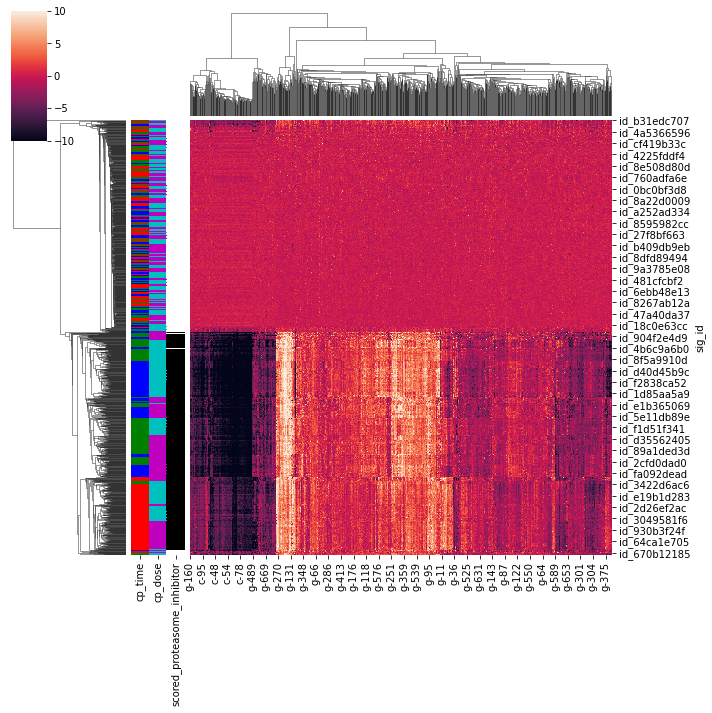

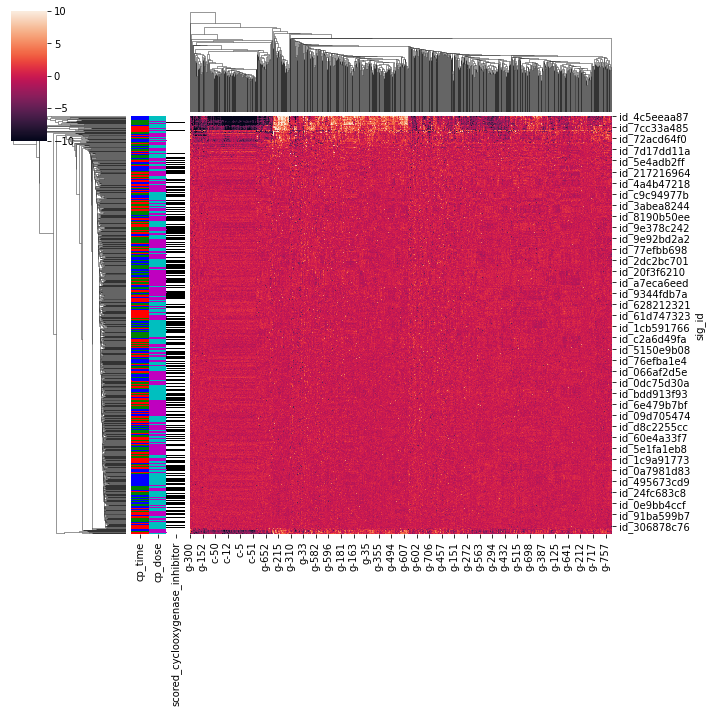

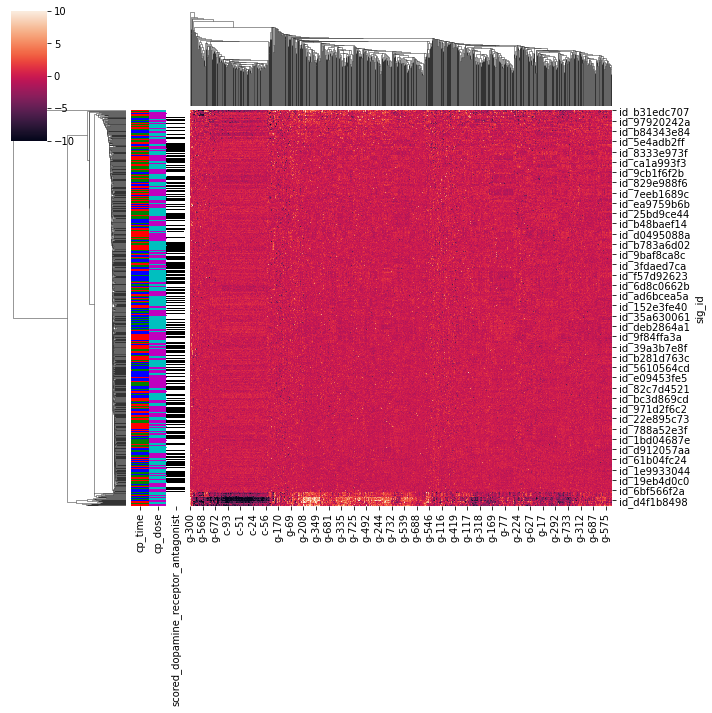

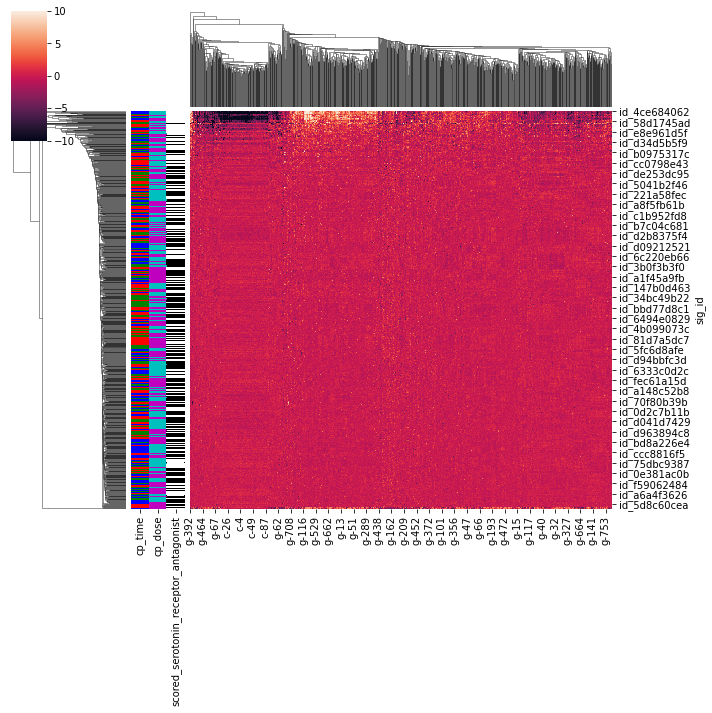

In [16]:
for col in target_sorted.index[:5]:
    plot_clustermap_compare(df_full, col)
    plt.show()

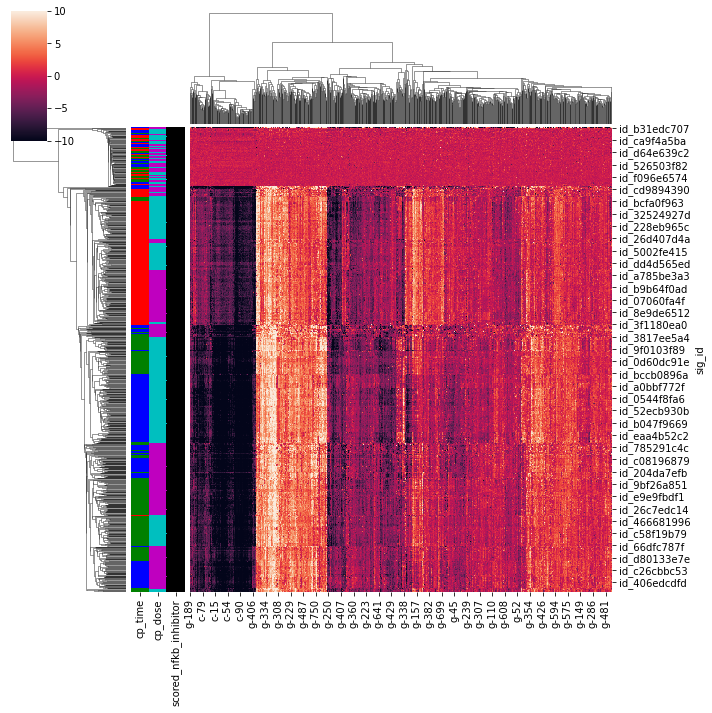

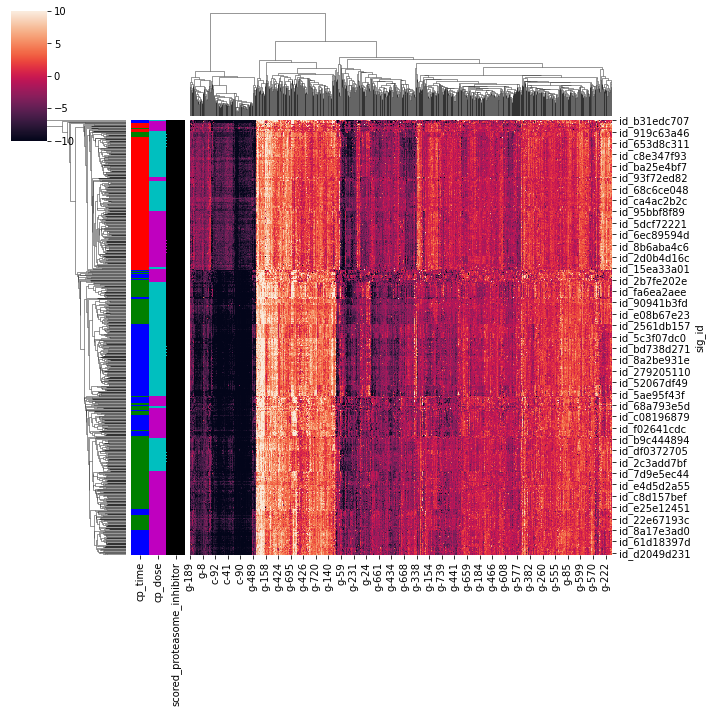

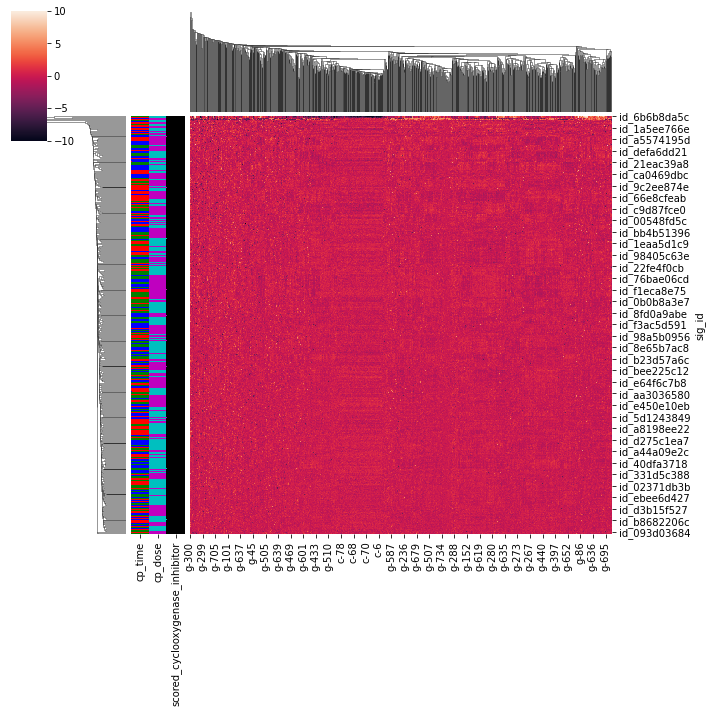

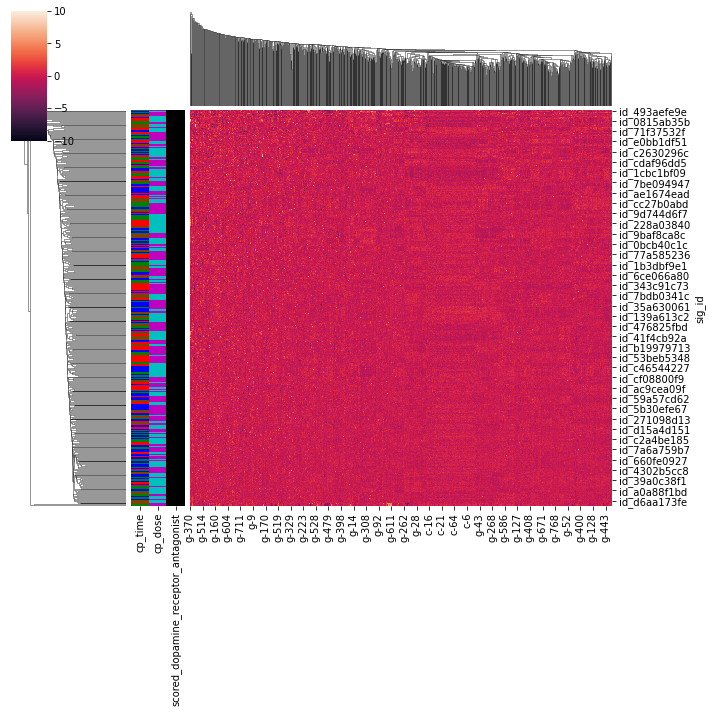

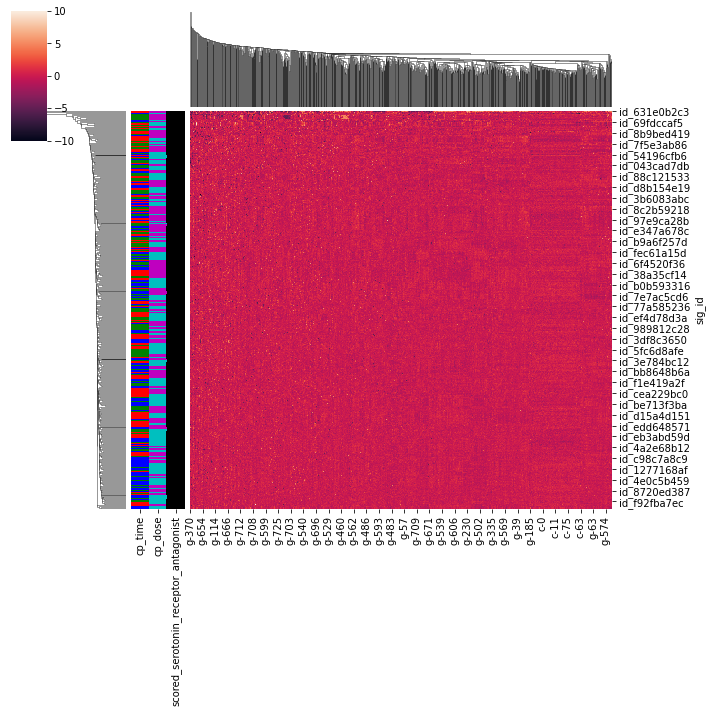

In [20]:
for col in target_sorted.index[:5]:
    plot_clustermap(df_full, col)
    plt.show()

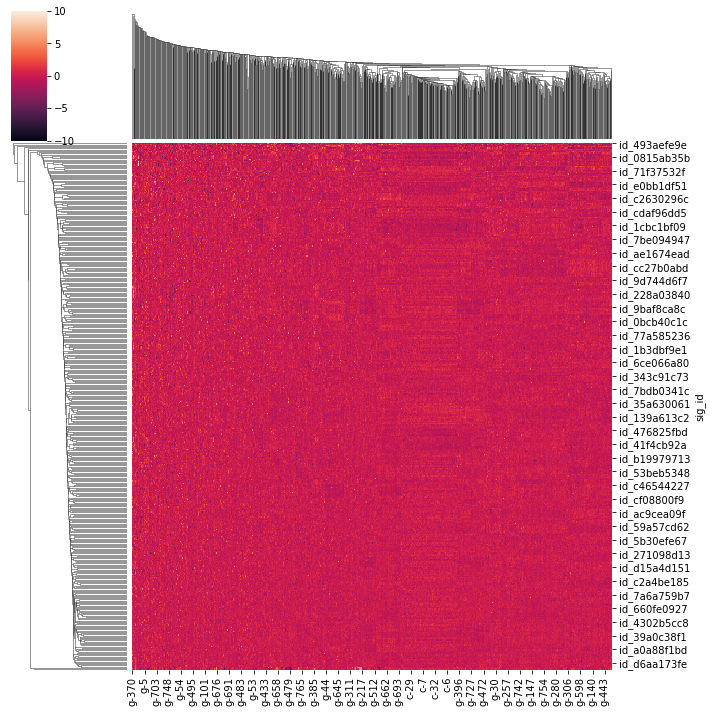

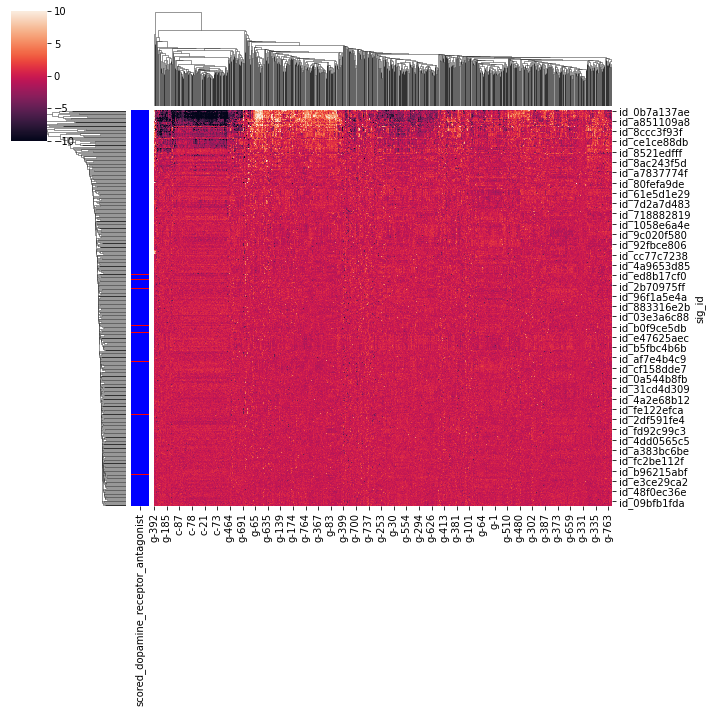

In [21]:
sns.clustermap(df_full[df_full['scored_dopamine_receptor_antagonist'] == 1].filter(regex='^(c|g)-'))
df_sample = df_full.sample(500)
sns.clustermap(df_sample.filter(regex='^(c|g)-'), row_colors=df_sample['scored_dopamine_receptor_antagonist'].map({0: 'blue', 1: 'red'}))

In [22]:
def plot_features(df, label, sample=100):
    df = df.sample(sample).copy()
    df_g = df.filter(regex='^g-')
    df_c = df.filter(regex='^c-')
    #df_g = np.sort(df_g.values, axis=1)
    #df_c = np.sort(df_c.values, axis=1)
    
    fig = plt.figure(figsize=(24, 5))
    
    ax = fig.add_subplot(1, 2, 1)
    sns.heatmap(df_g, ax=ax, vmin=-3, vmax=+3)
    
    ax = fig.add_subplot(1, 2, 2)
    sns.heatmap(df_c, ax=ax, vmin=-3, vmax=+3)
    
    fig.suptitle(label)
    plt.show()

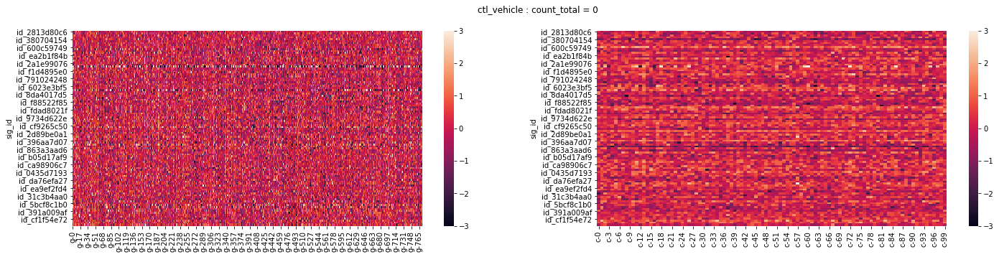

In [23]:
plot_features(df_full[(df_full['cp_type'] == 'ctl_vehicle') & (df_full['count_total'] == 0)], 'ctl_vehicle : count_total = 0')

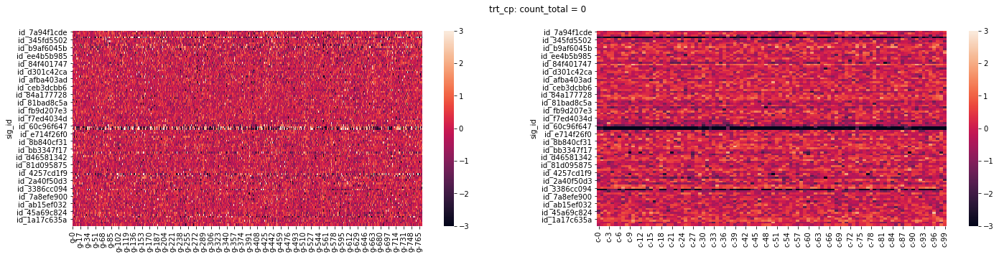

In [24]:
plot_features(df_full[(df_full['cp_type'] == 'trt_cp') & (df_full['count_total'] == 0)], 'trt_cp: count_total = 0')

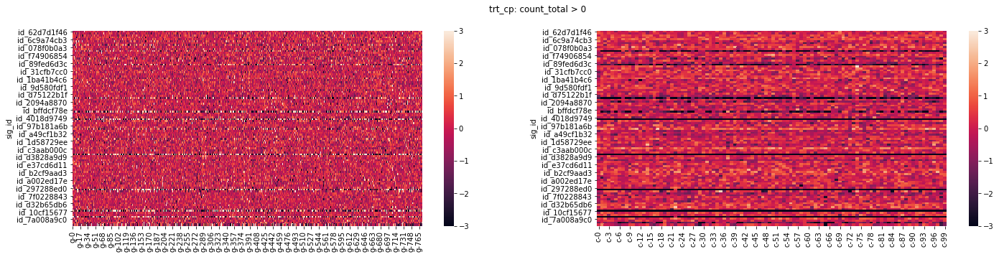

In [25]:
plot_features(df_full[(df_full['cp_type'] == 'trt_cp') & (df_full['count_total'] > 0)], 'trt_cp: count_total > 0')

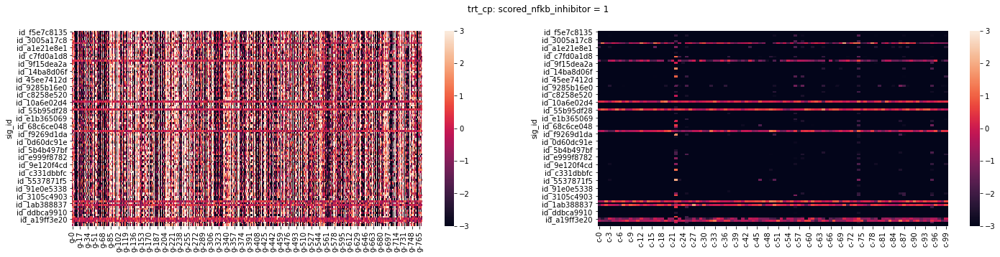

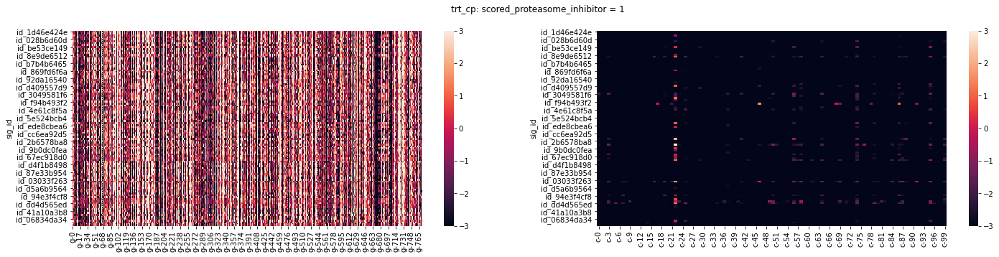

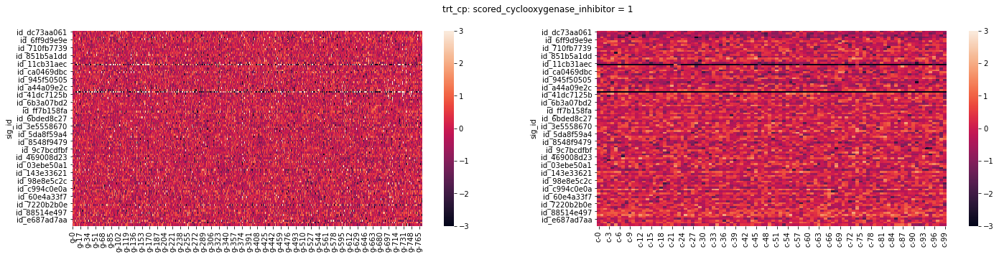

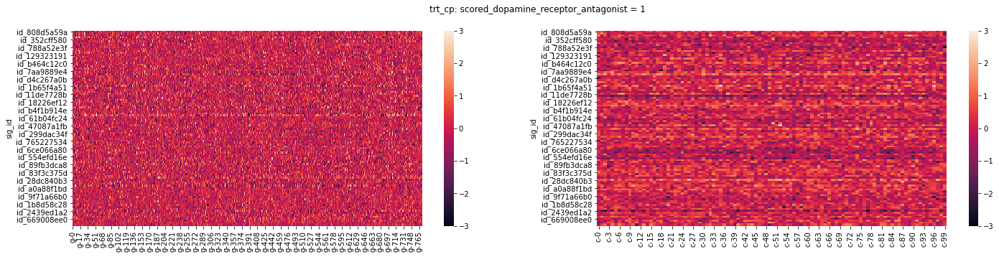

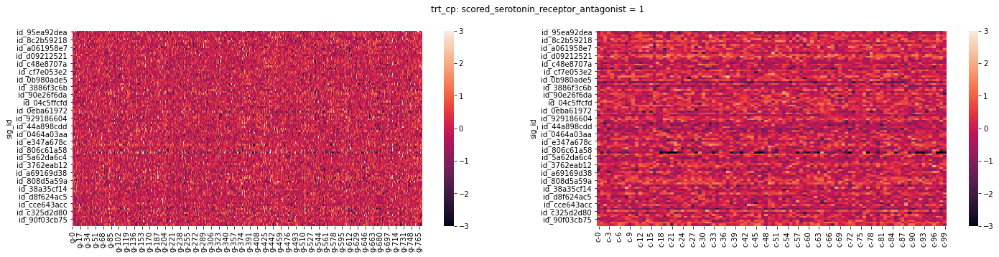

In [26]:
for col in target_sorted.index[:5]:
    plot_features(df_full[(df_full['cp_type'] == 'trt_cp') & (df_full[col] == 1)], f"trt_cp: {col} = 1")

In [27]:
def plot_jointhist(df, col, tar):
    df_joint = pd.DataFrame({col: df[col], 'count': df[col].map(df[col].value_counts().to_dict()), tar: df[tar]})
    sns.jointplot(data=df_joint[df_joint[tar] == 0], x=col, y='count', kind='hex', xlim=[-10, +10], ylim=[0, 25], height=5)
    sns.jointplot(data=df_joint[df_joint[tar] == 1], x=col, y='count', kind='hex', xlim=[-10, +10], ylim=[0, 25], height=5)

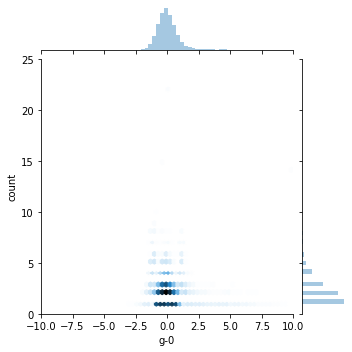

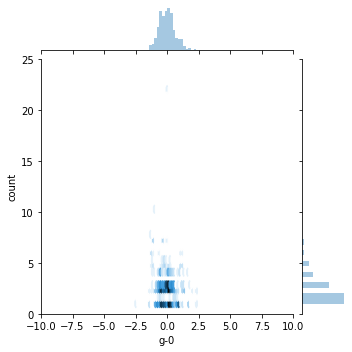

In [205]:
plot_jointhist(df_full, 'g-0', 'scored_dopamine_receptor_antagonist')

In [388]:
def plot_2dhist(df, col, tar):
    x = df[col]
    y = df[col].map(df[col].value_counts().to_dict())
    z = df[tar]
    
    xedges = np.arange(-10.5, +11.0, +1.0)
    yedges = np.arange(+0.5, +26.0, +1.0)
    H0, _, _ = np.histogram2d(x[z == 0], y[z == 0], bins=(xedges, yedges))
    H1, _, _ = np.histogram2d(x[z != 0], y[z != 0], bins=(xedges, yedges))
    H0 = H0.T
    H1 = H1.T
    
    xmean = (xedges[1:] + xedges[:-1]) / 2
    ymean = (yedges[1:] + yedges[:-1]) / 2
    df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
    df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 6))
    
    sns.heatmap(df_hist1, ax=ax1, vmin=0.0, vmax=1.00, cmap='jet')
    ax1.invert_yaxis()
    ax1.set_xlabel(col)
    ax1.set_ylabel('Count')
    
    sns.heatmap(df_hist2, ax=ax2, vmin=0.0, vmax=1.00, cmap='jet')
    ax2.invert_yaxis()
    ax2.set_xlabel(col)
    ax2.set_ylabel('')
    ax2.set_yticks([])
    
    sns.distplot(x, ax=ax3, bins=np.arange(-10.5, +11.0, +0.5), center=True)
    
    fig.suptitle(tar)
    plt.show()

<ipython-input-388-224fb385ef80>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-388-224fb385ef80>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


TypeError: distplot() got an unexpected keyword argument 'center'

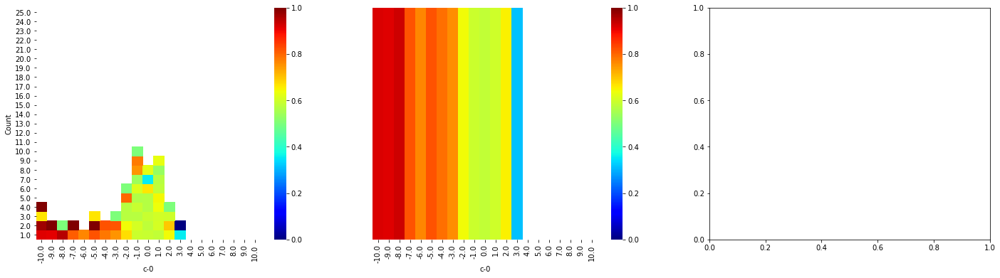

In [389]:
plot_2dhist(df_full, 'c-0', 'count_scored')

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


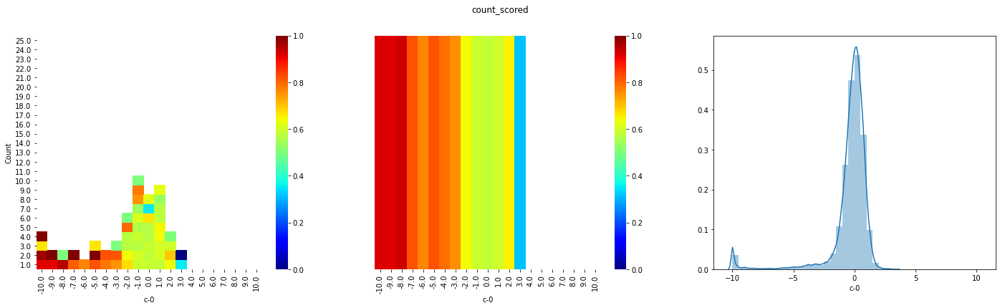

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


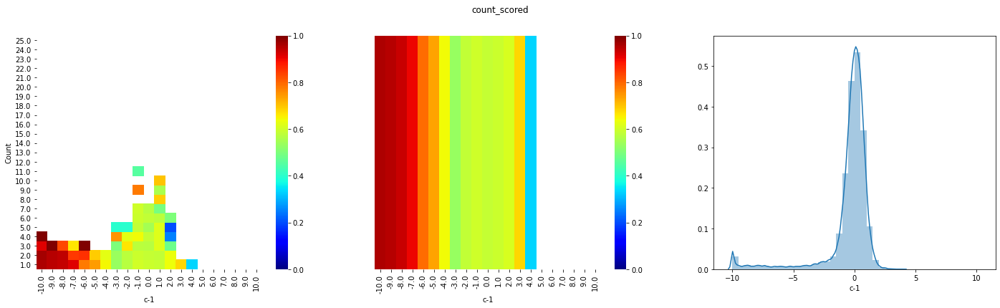

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


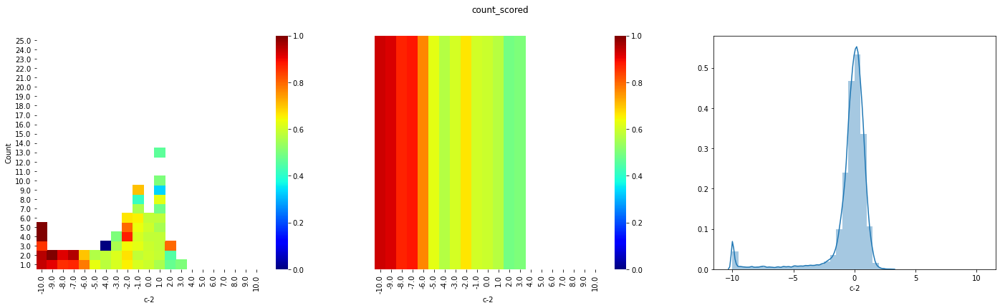

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


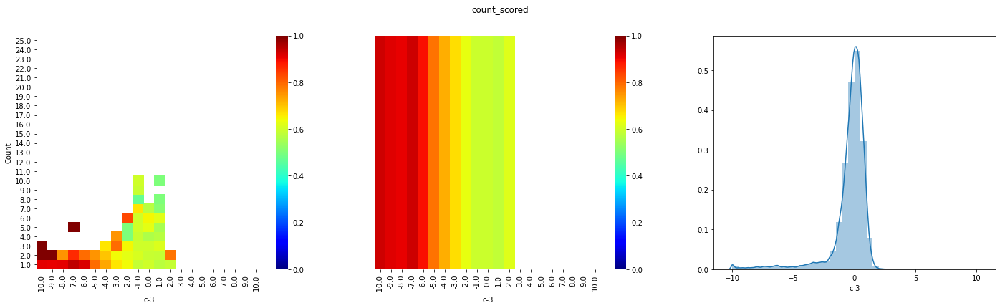

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


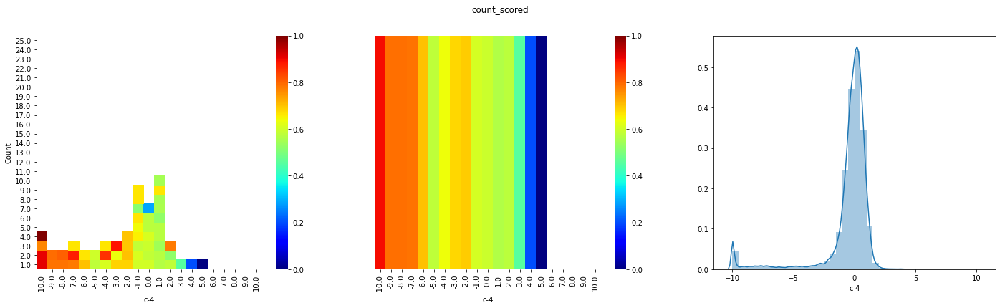

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


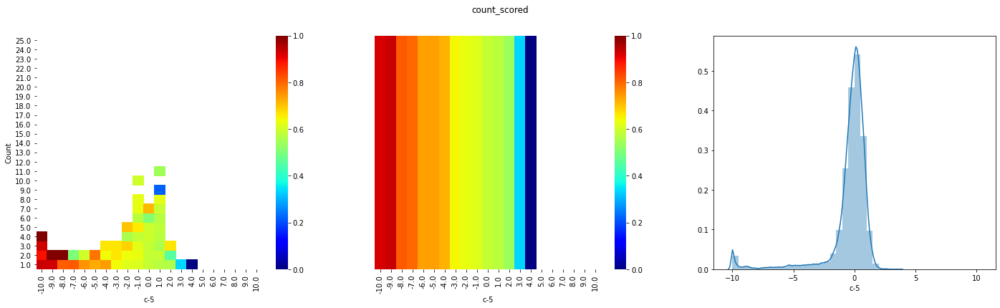

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


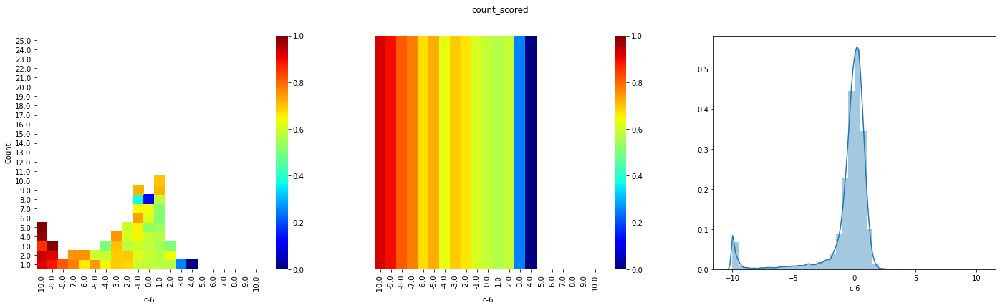

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


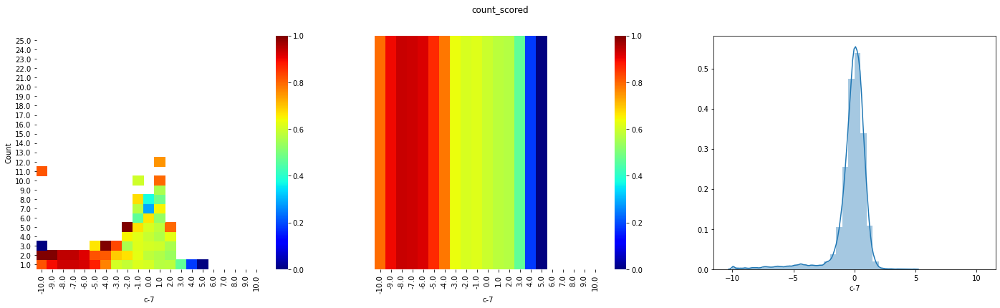

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


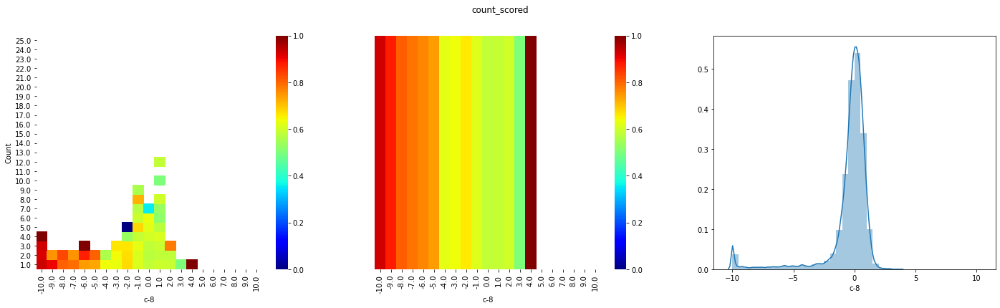

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


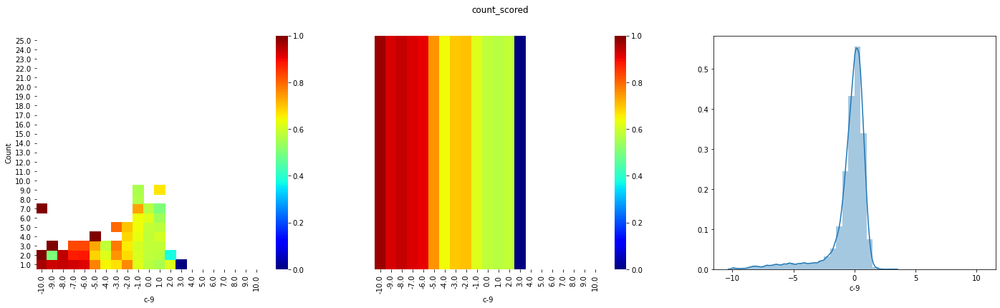

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


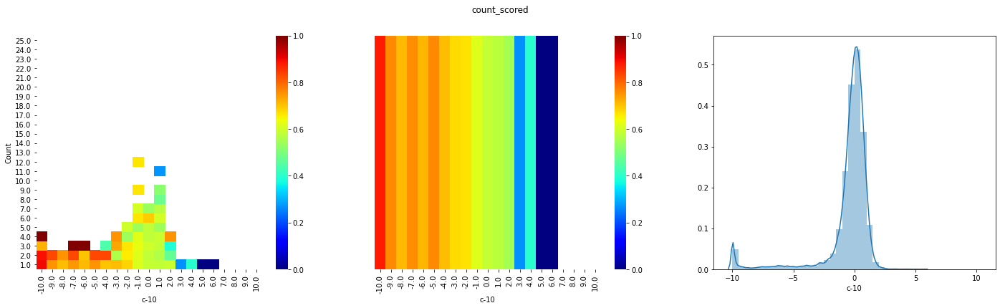

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


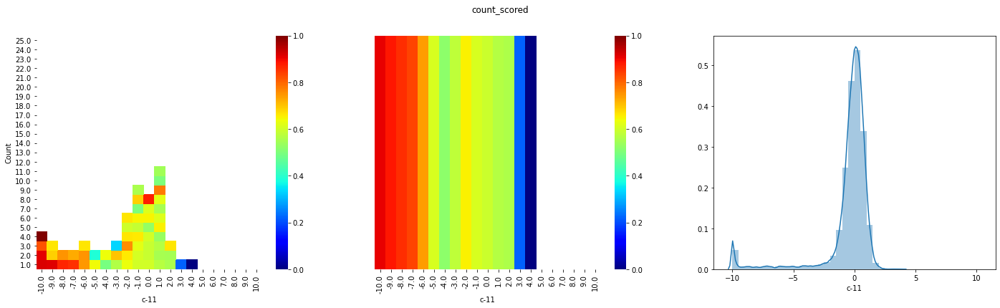

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


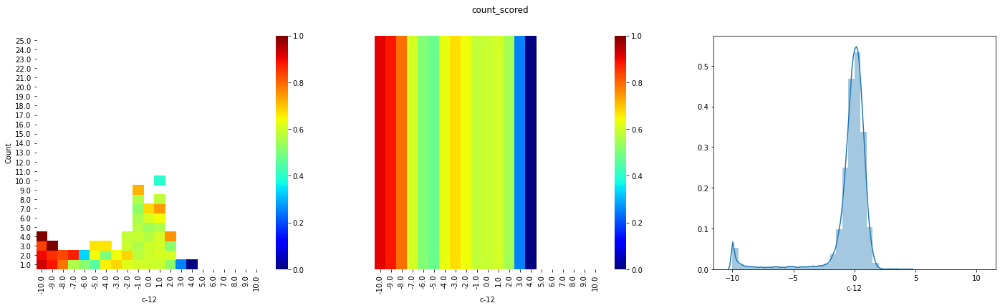

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


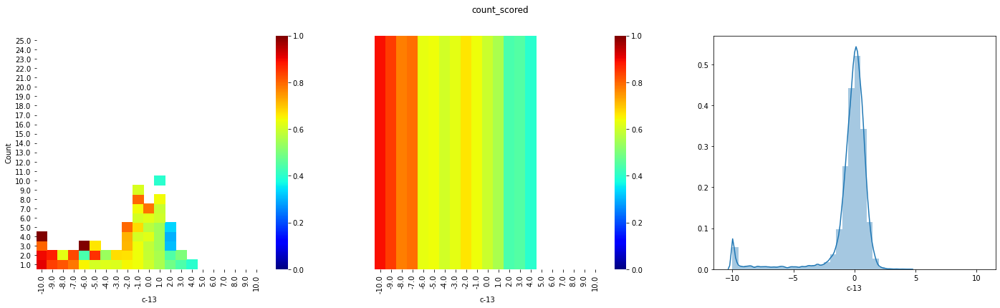

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


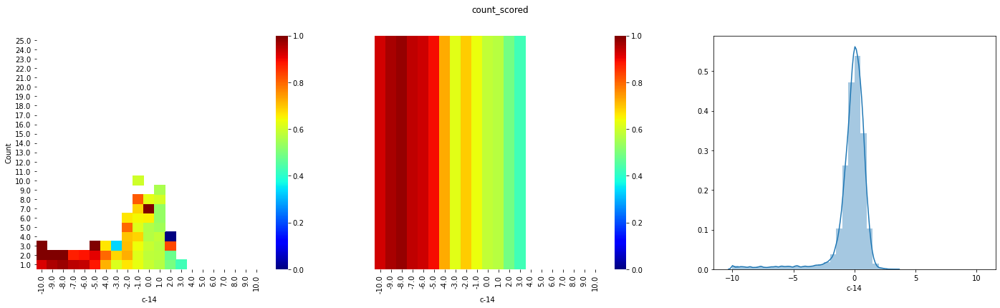

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


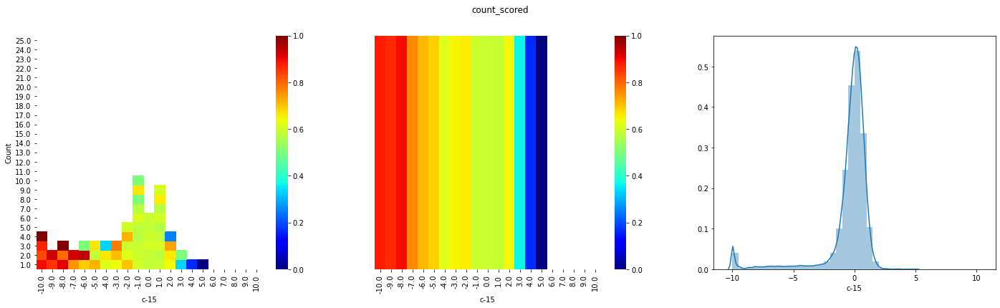

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


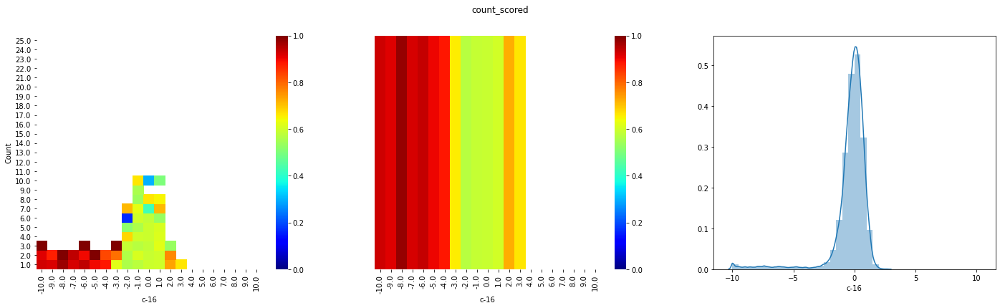

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


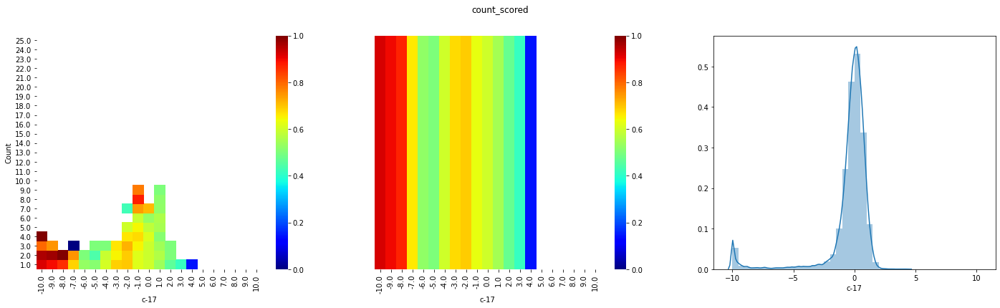

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


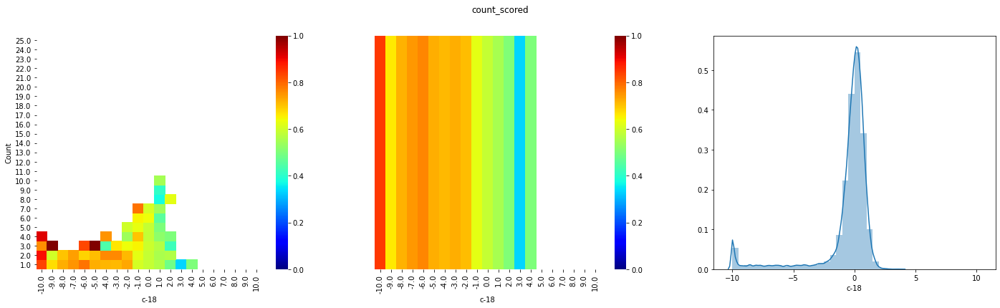

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


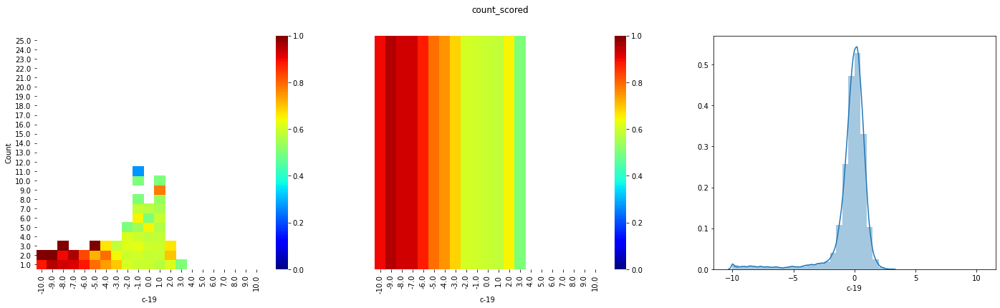

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


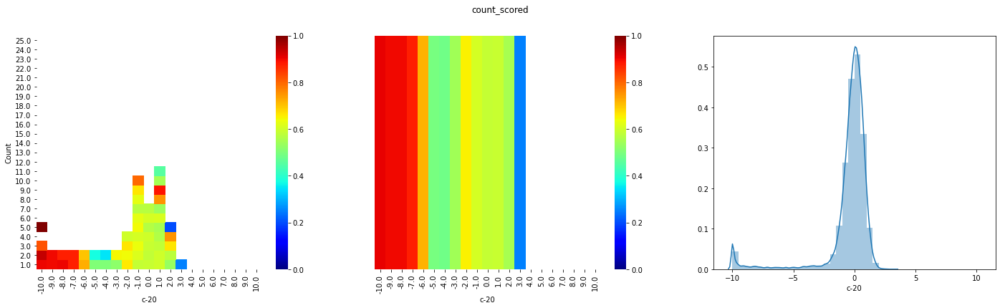

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


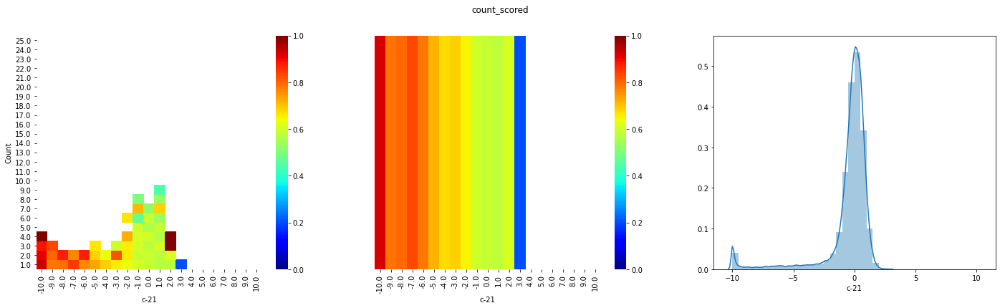

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


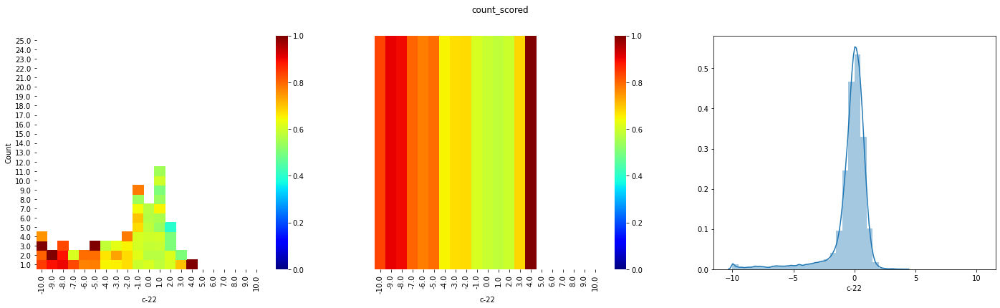

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


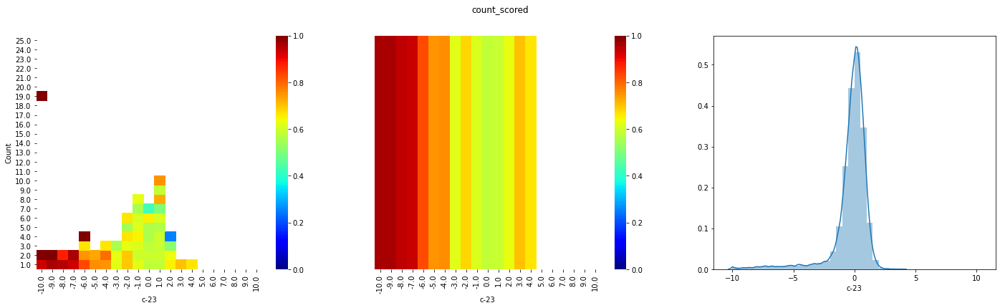

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


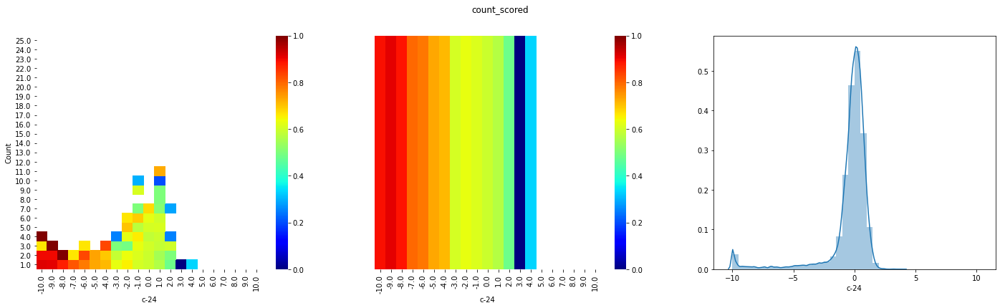

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


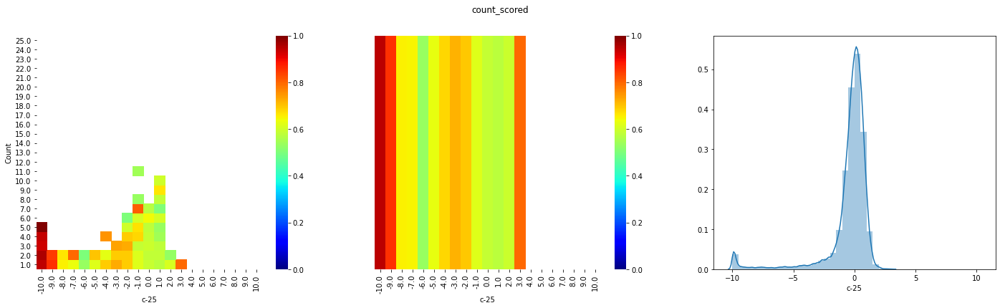

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


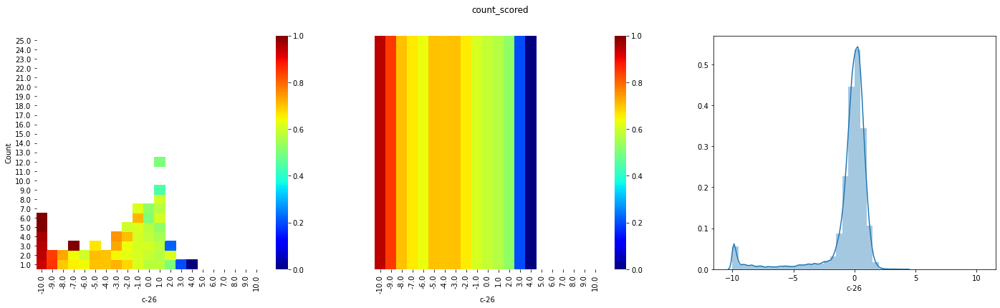

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


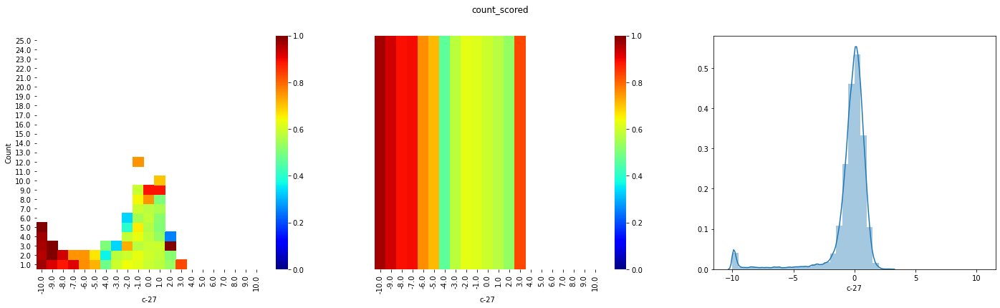

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


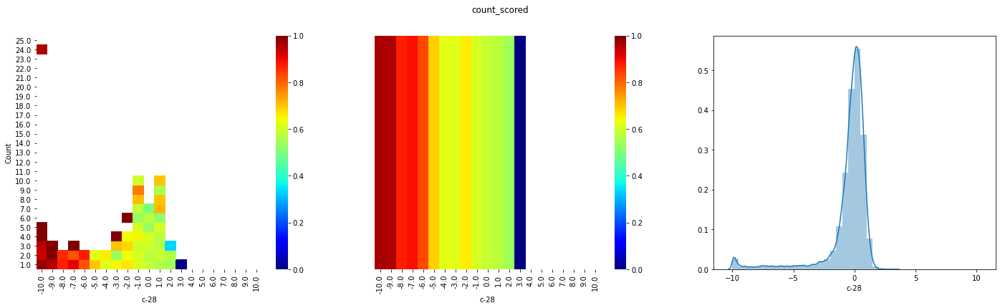

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


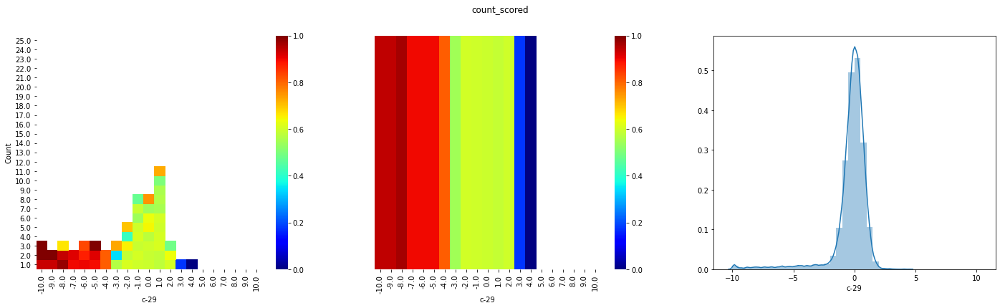

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


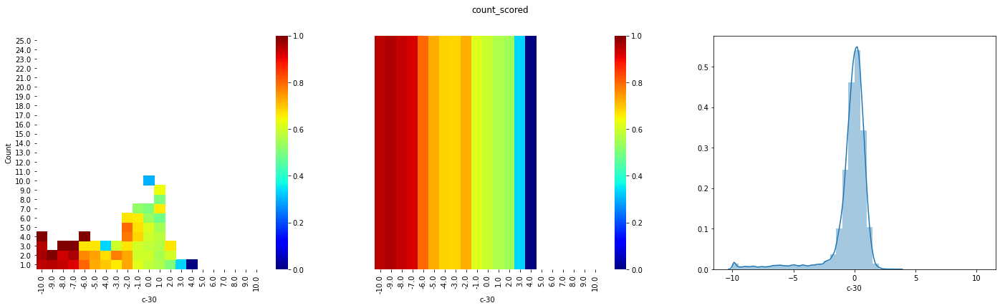

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


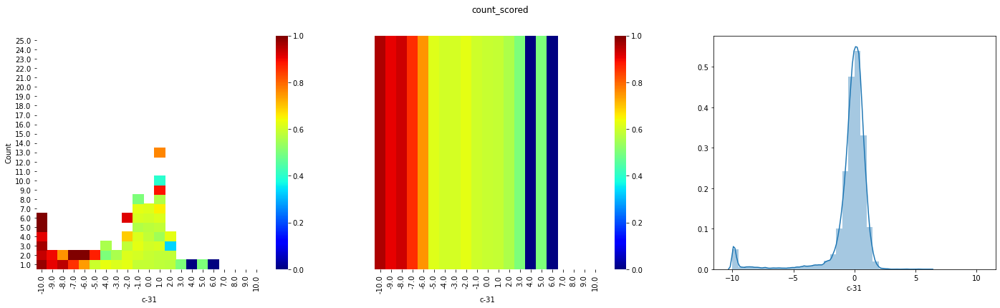

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


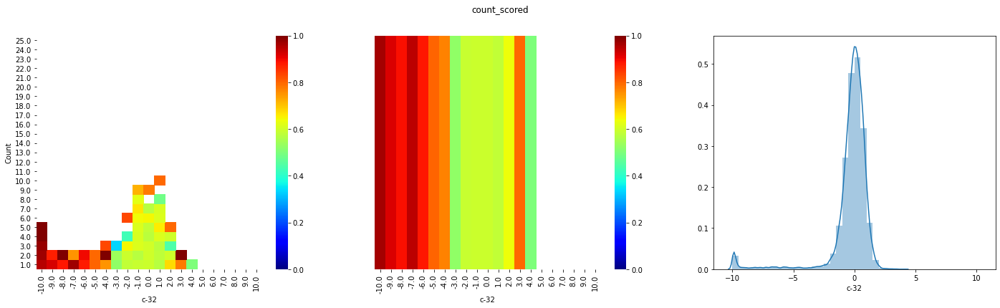

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


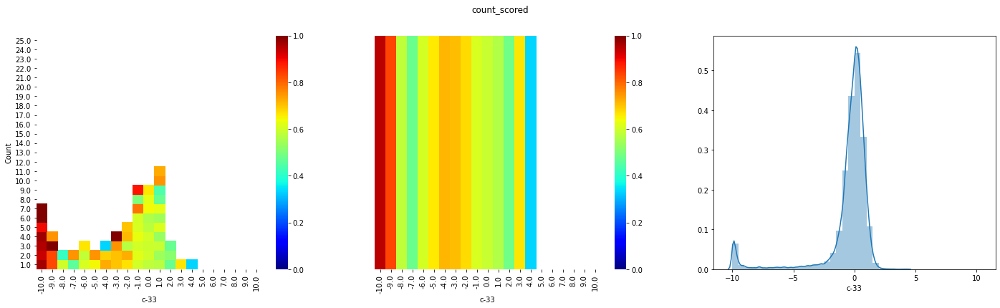

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


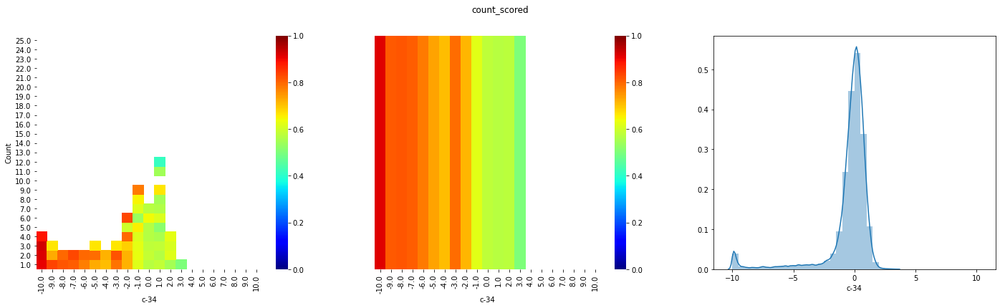

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


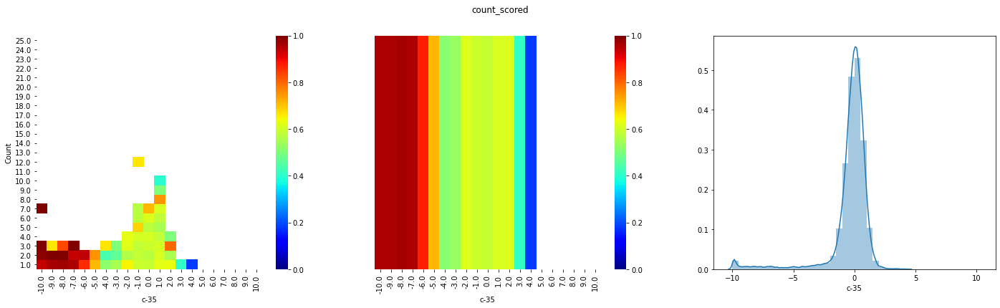

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


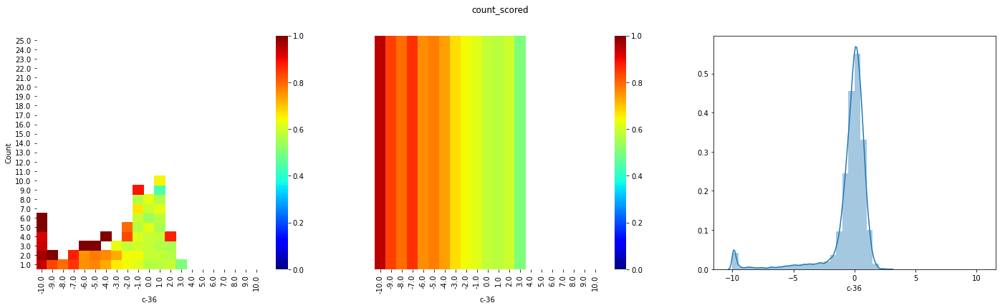

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


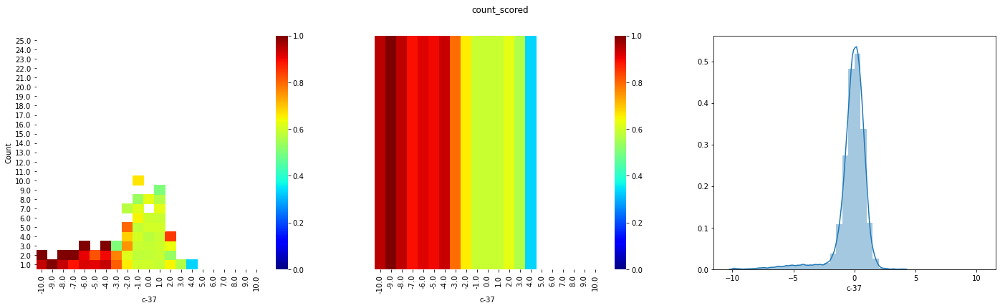

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


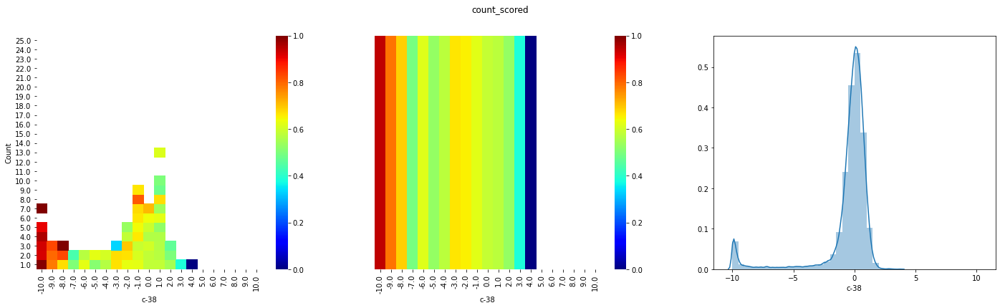

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


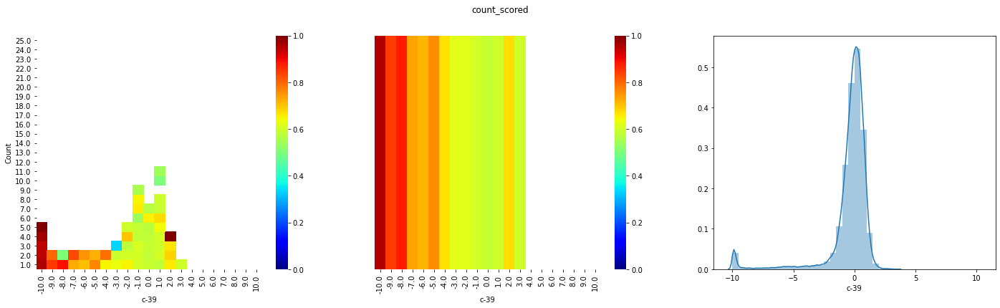

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


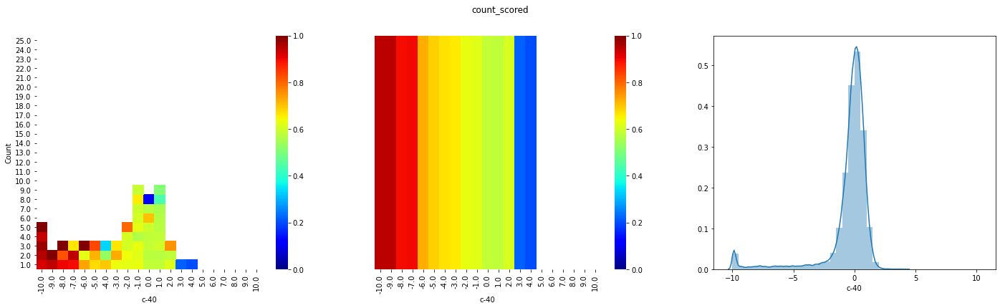

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


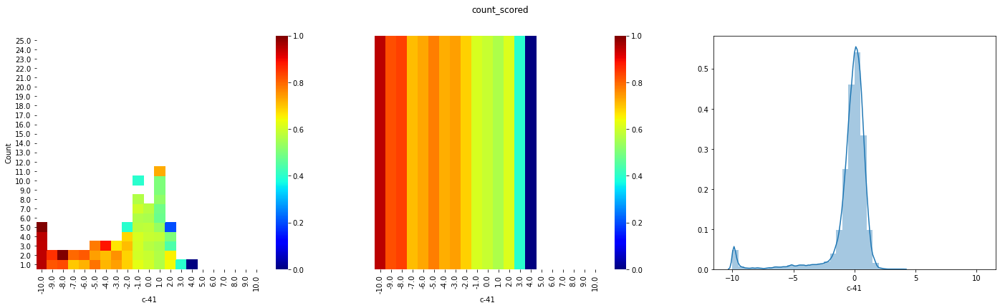

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


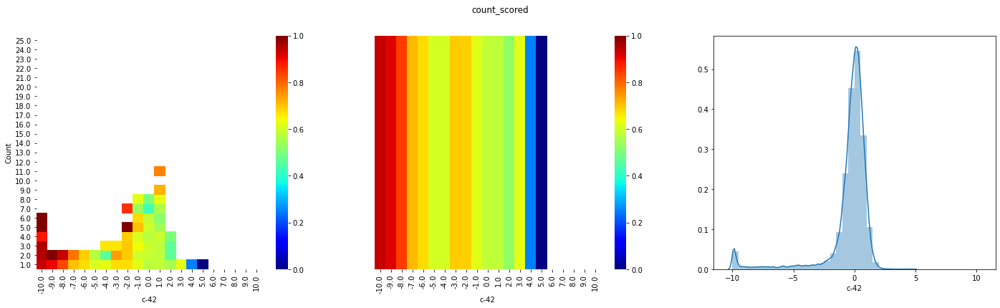

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


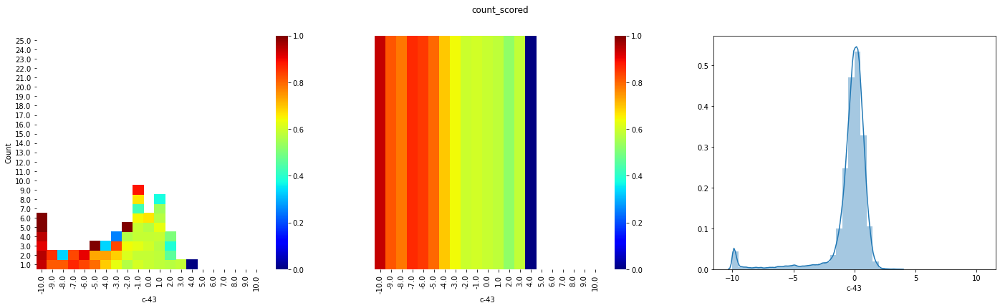

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


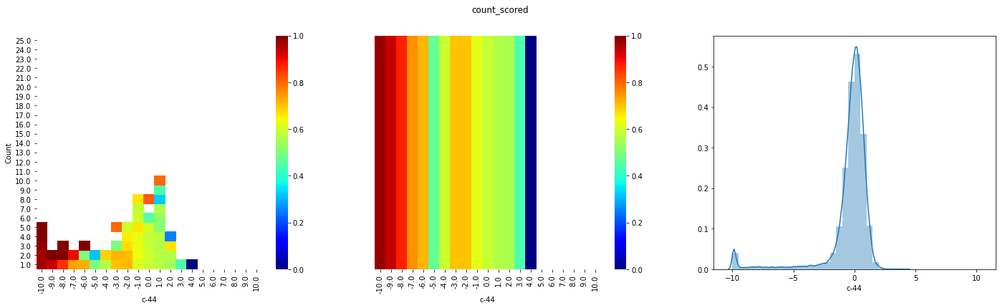

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


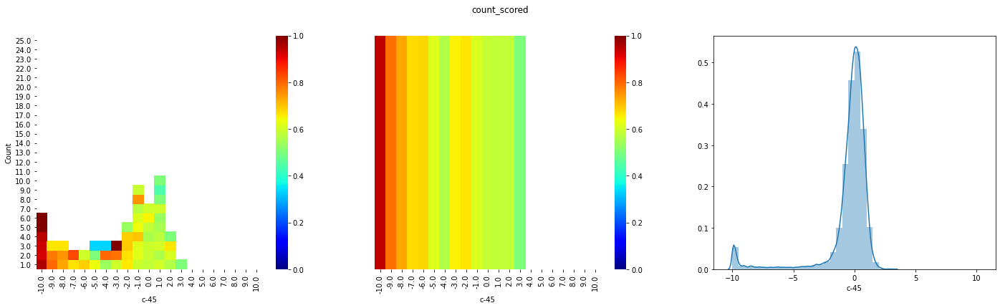

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


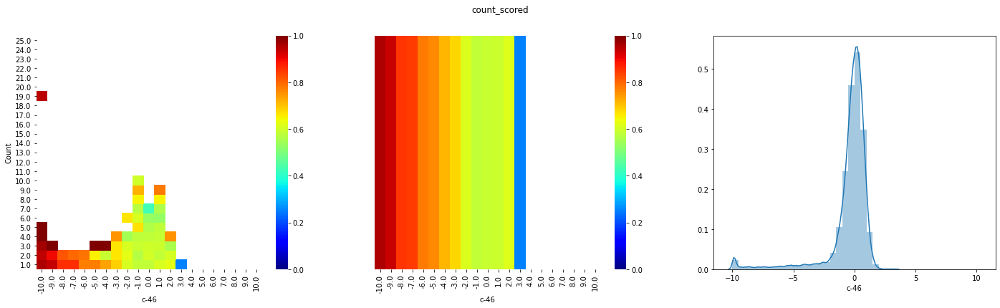

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


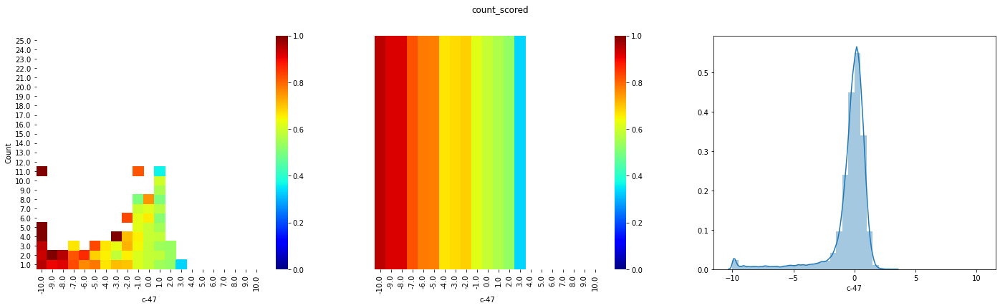

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


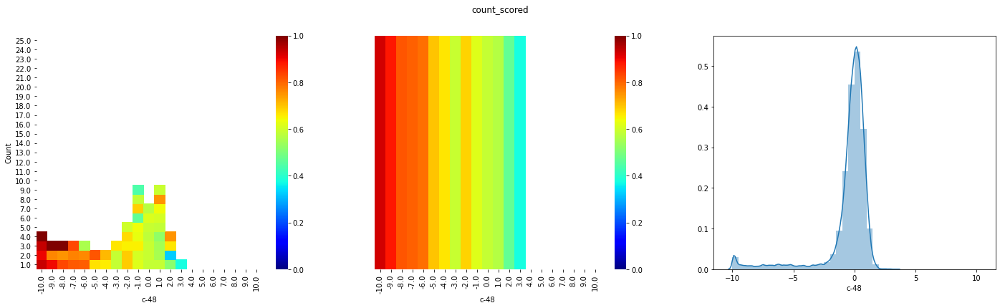

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


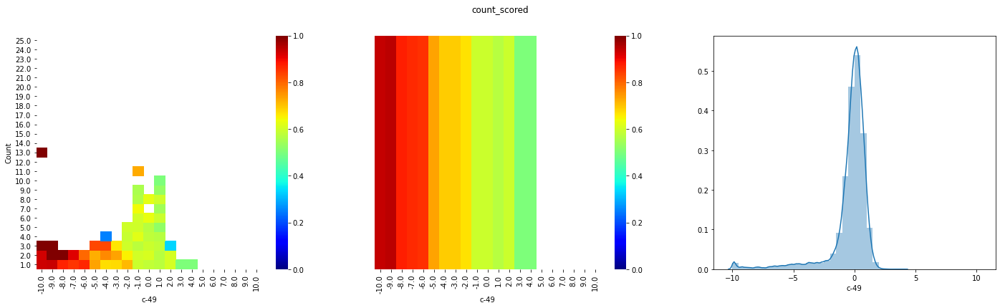

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


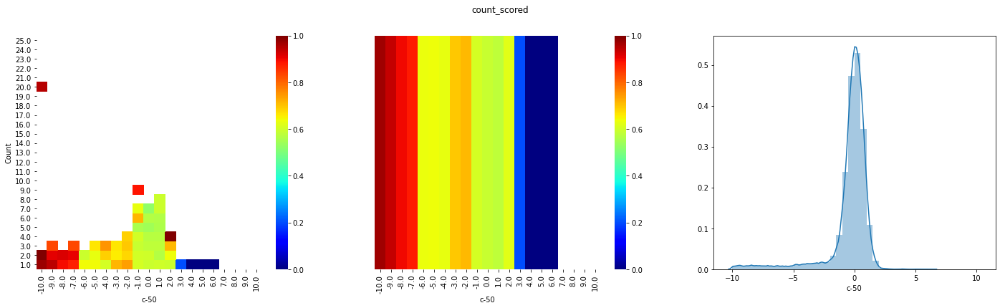

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


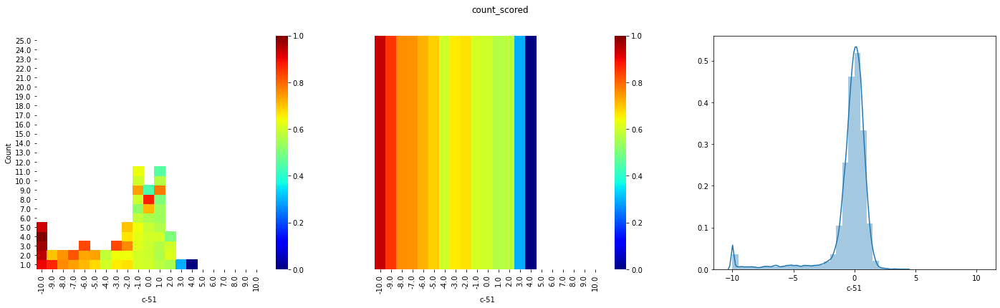

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


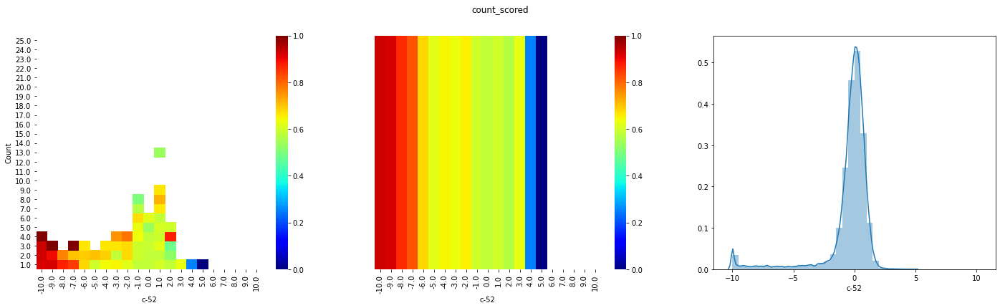

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


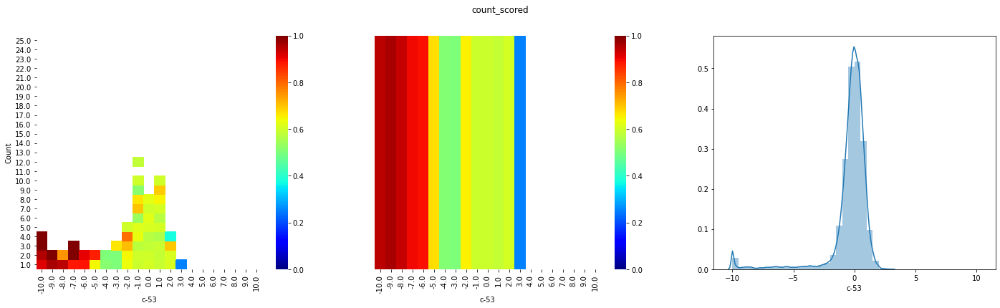

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


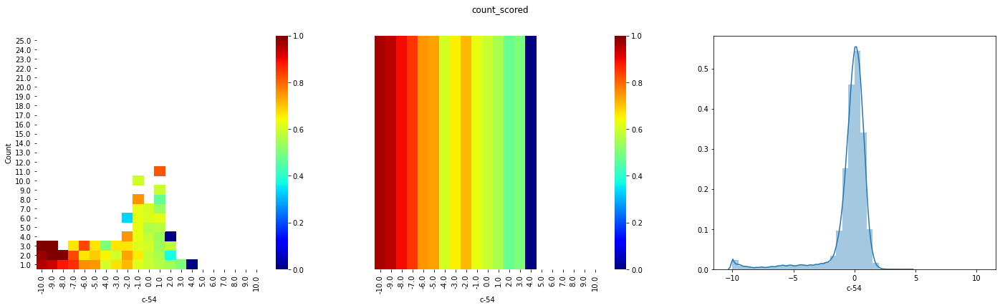

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


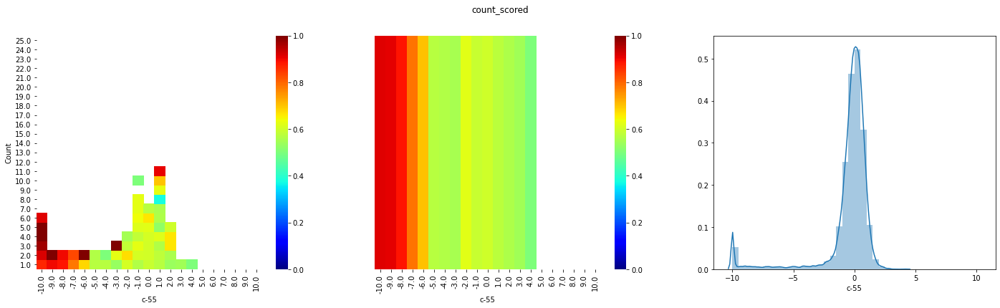

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


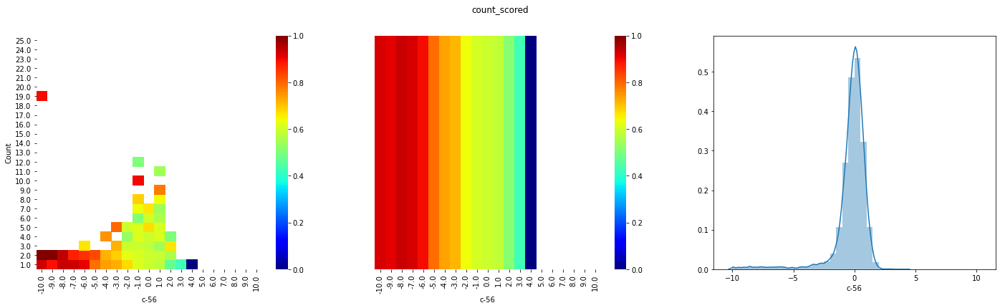

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


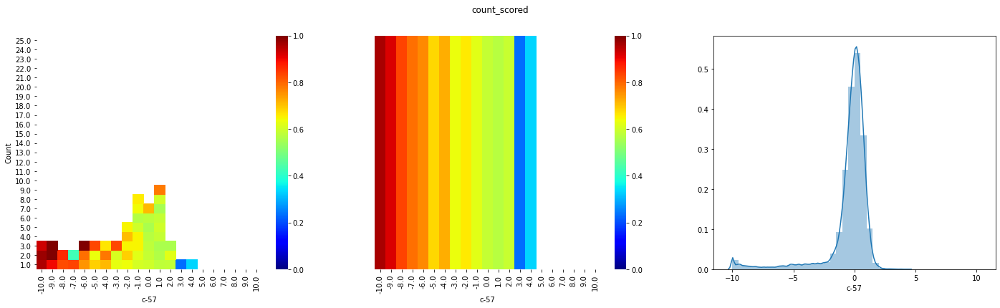

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


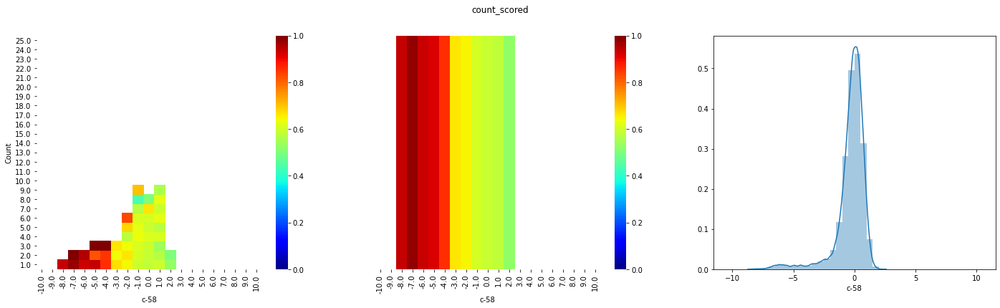

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


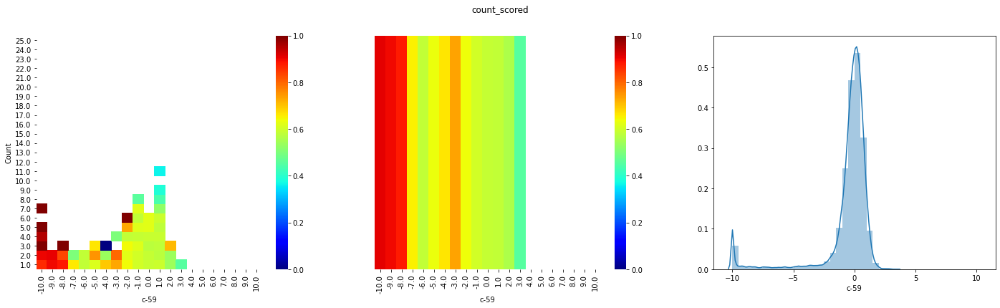

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


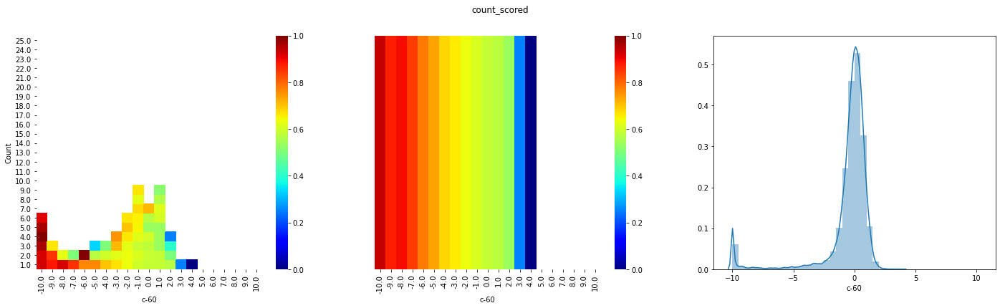

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


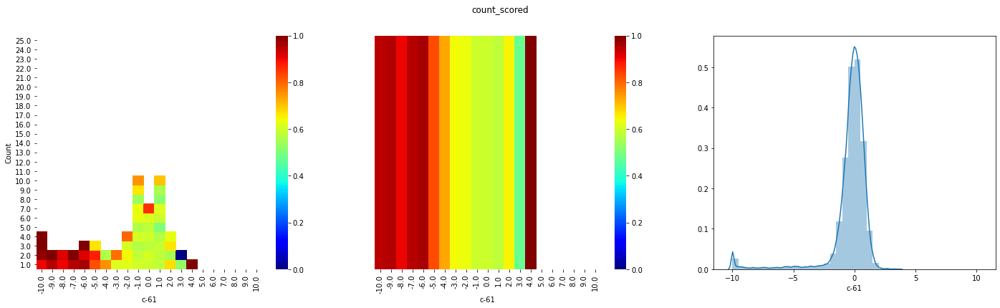

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


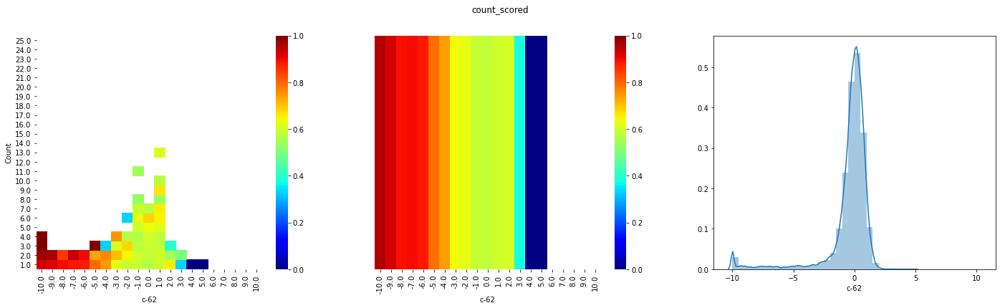

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


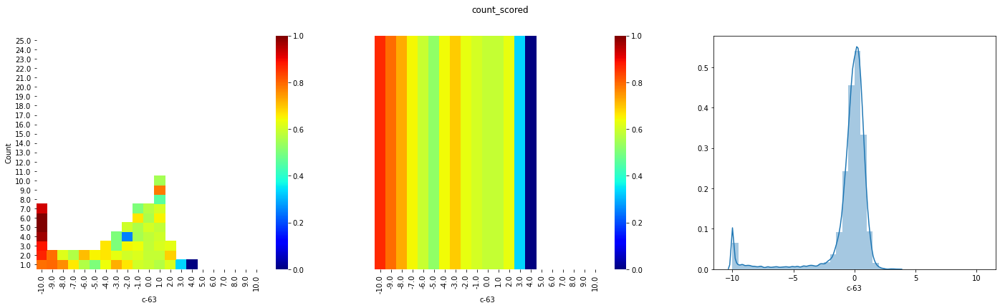

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


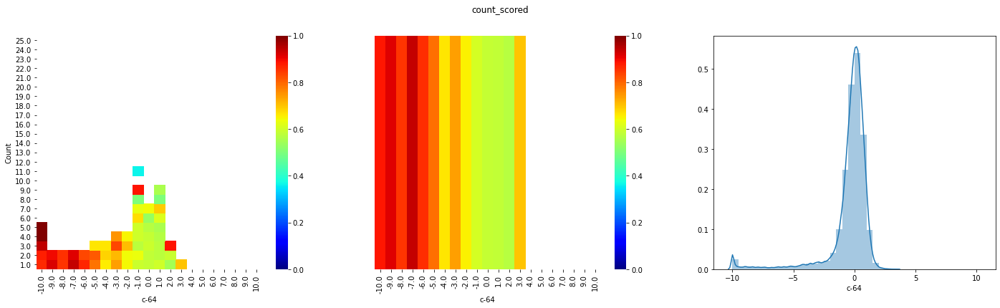

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


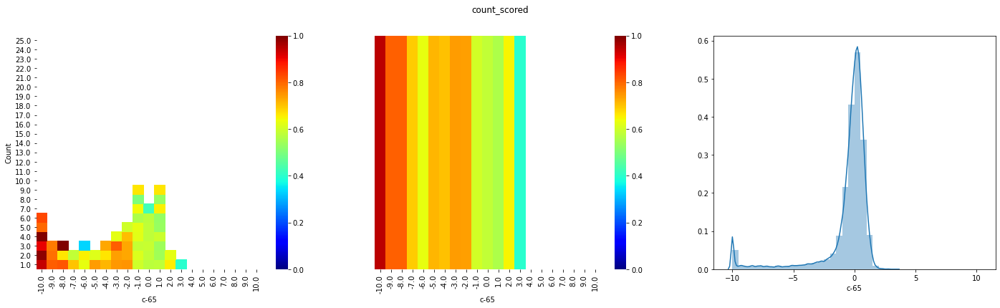

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


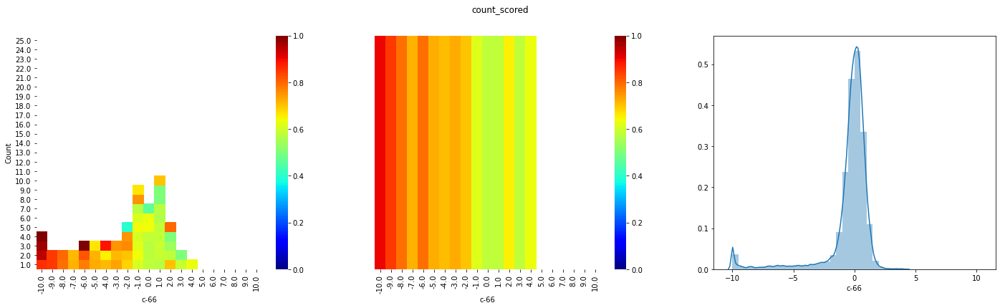

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


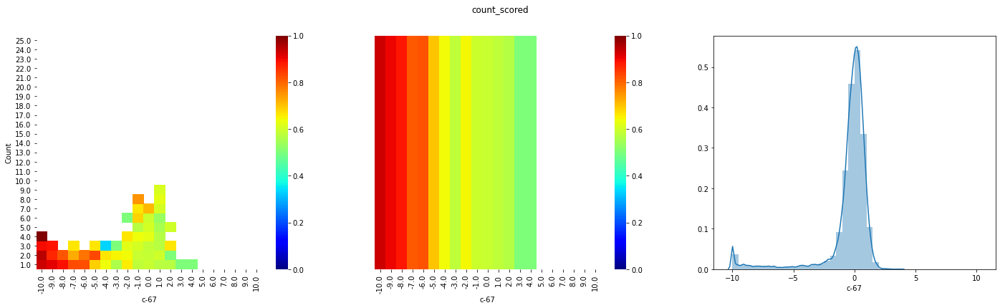

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


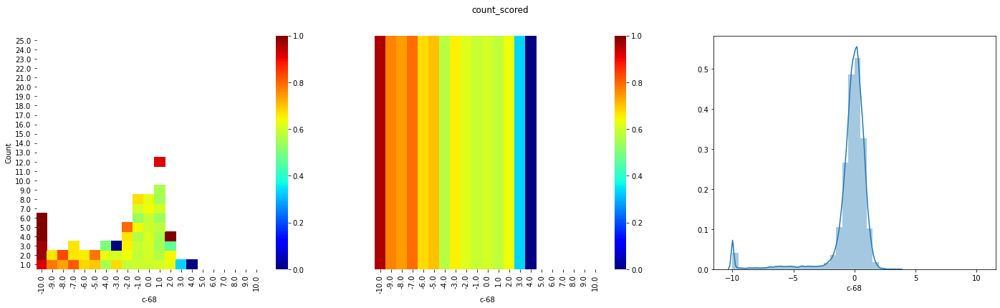

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


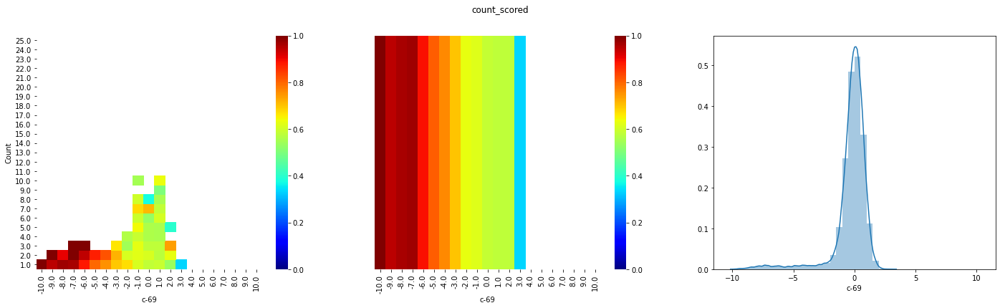

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


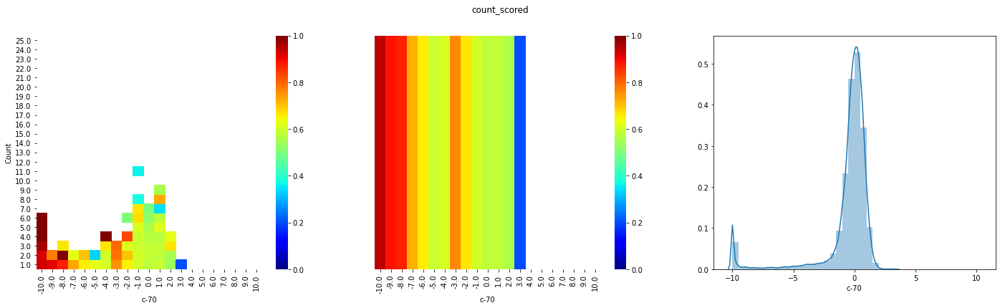

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


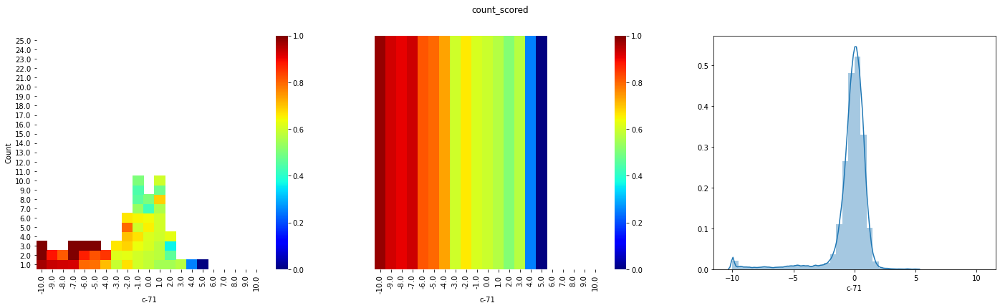

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


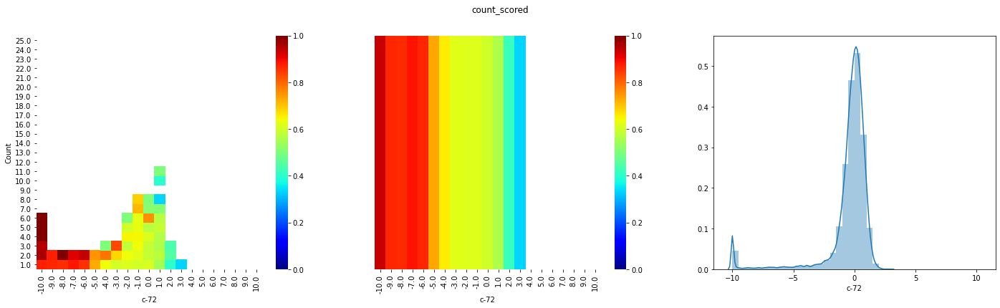

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


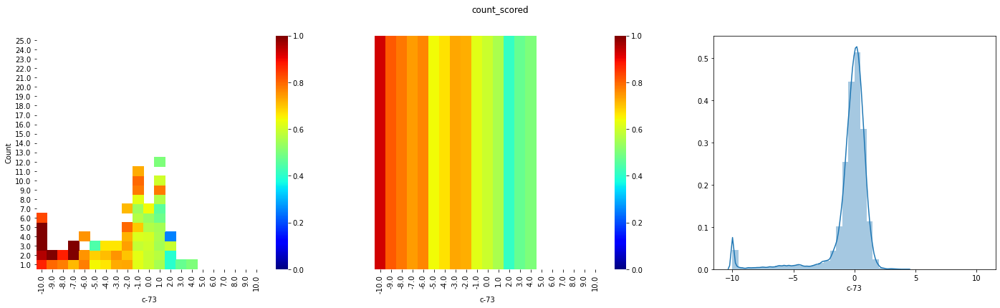

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


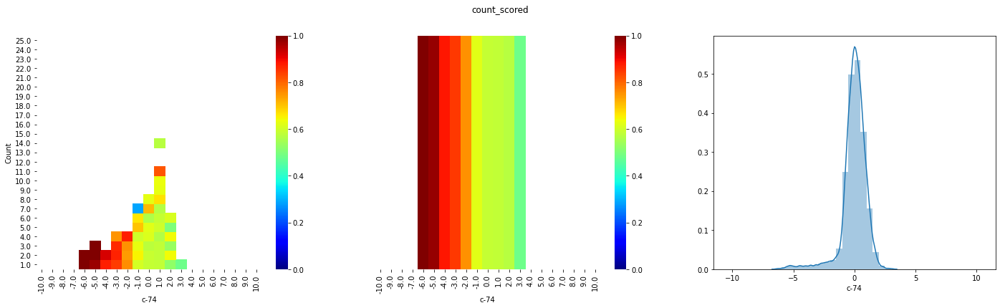

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


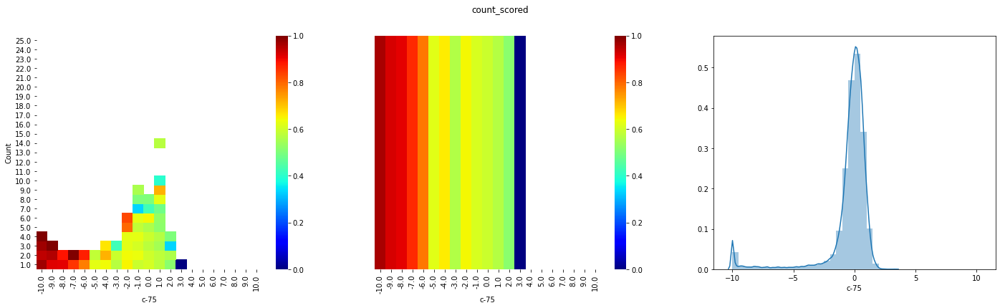

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


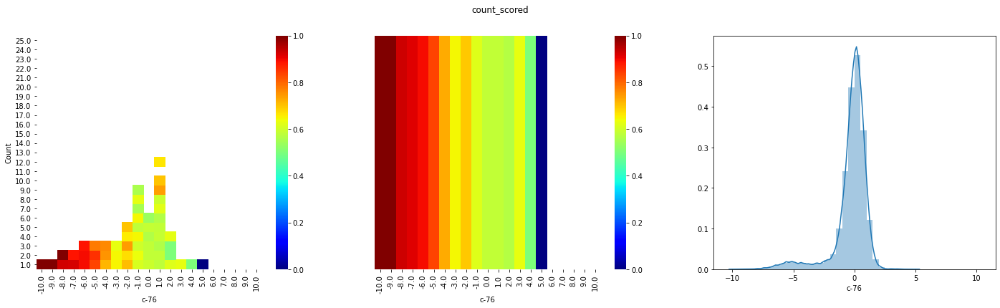

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


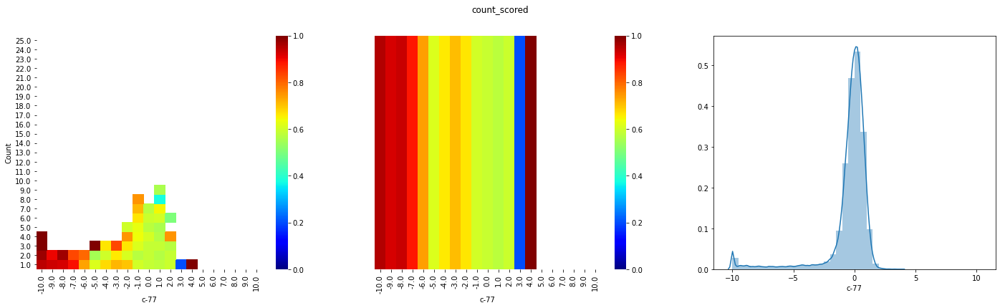

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


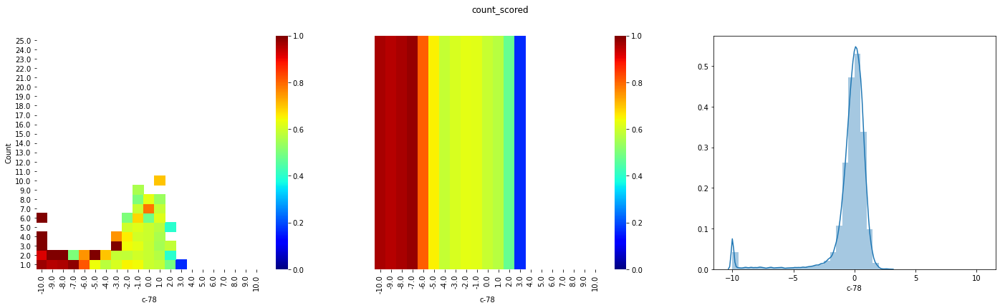

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


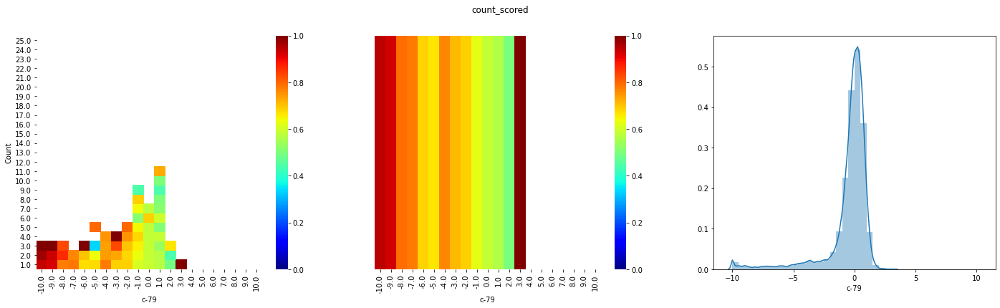

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


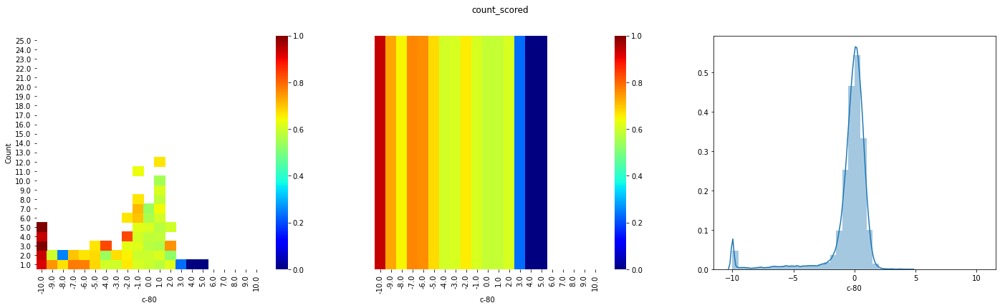

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


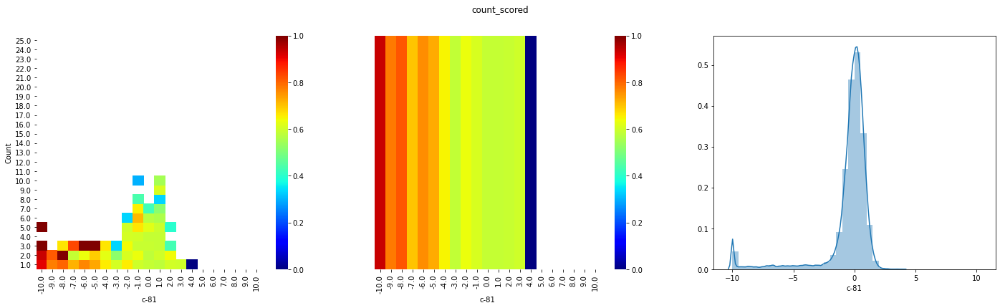

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


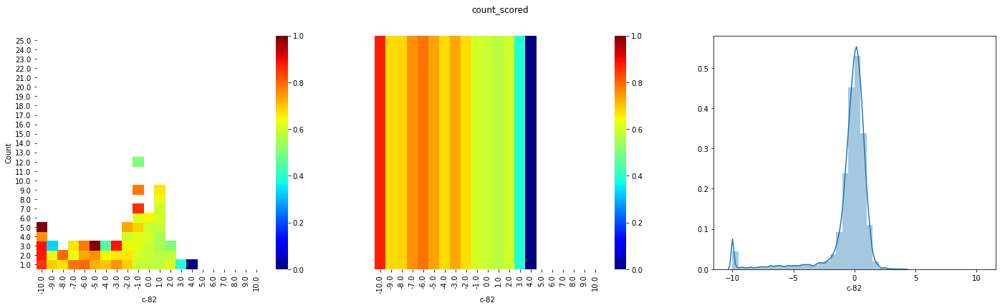

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


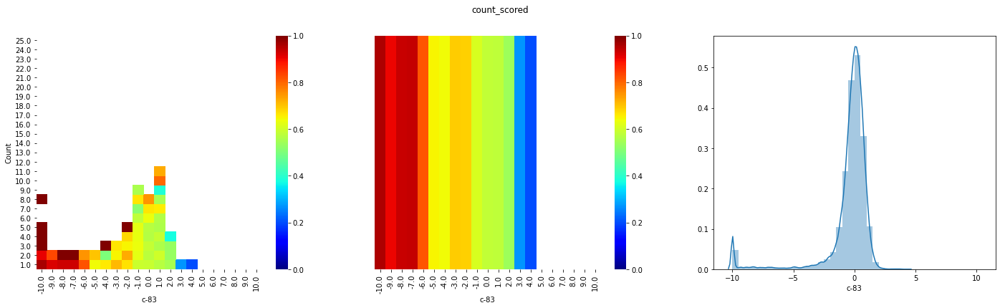

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


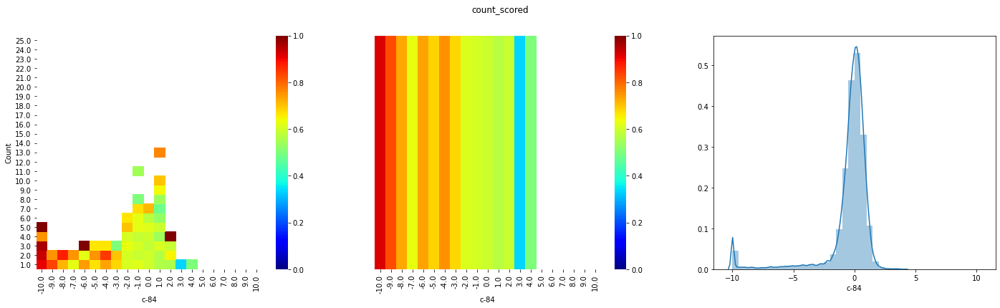

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


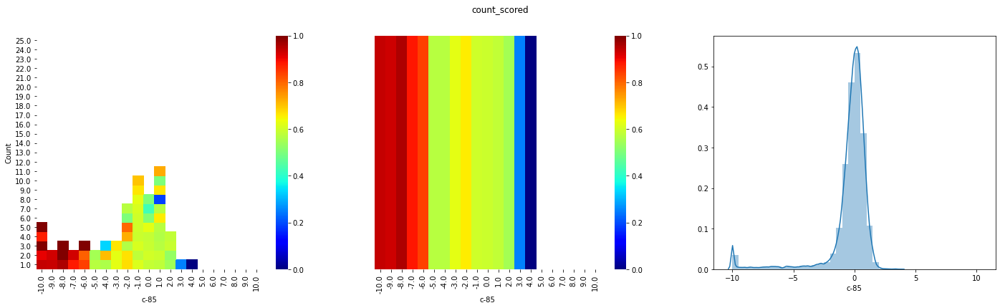

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


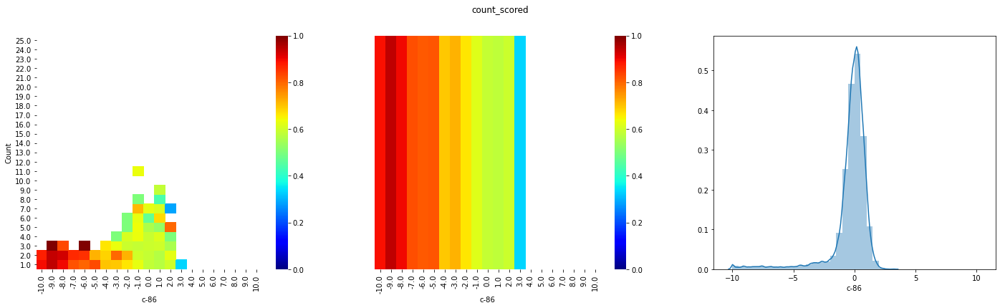

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


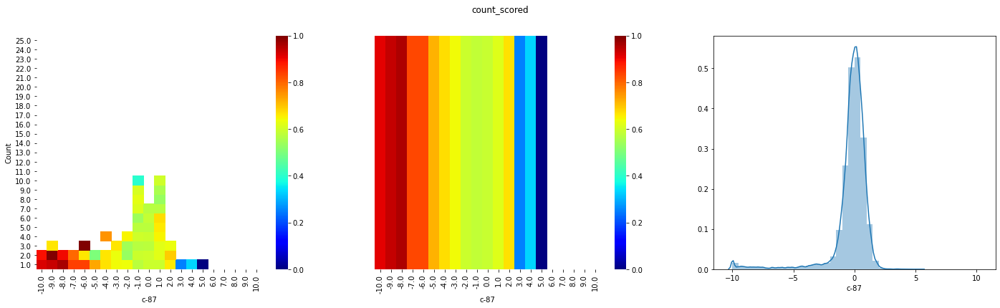

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


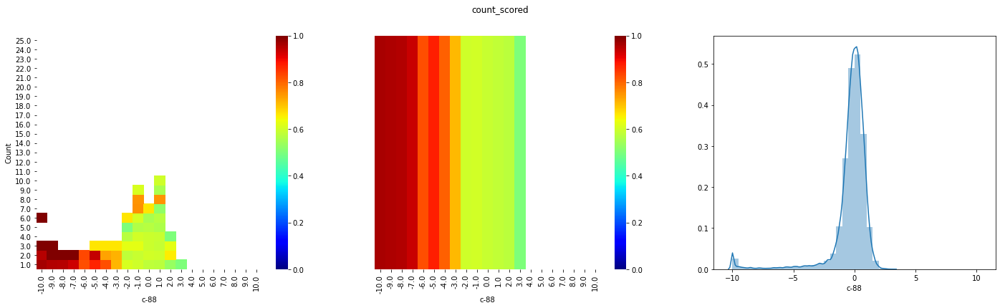

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


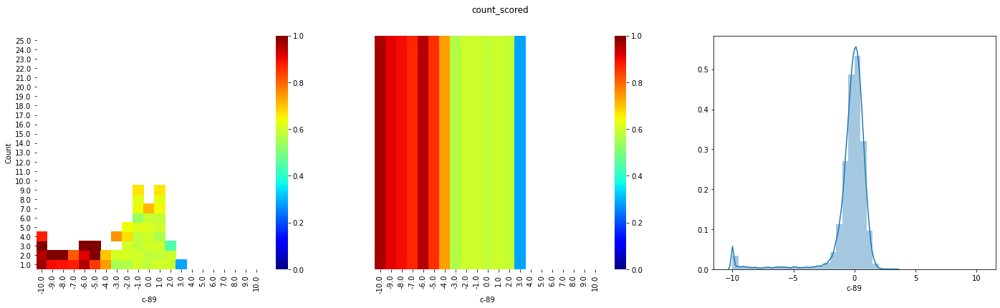

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


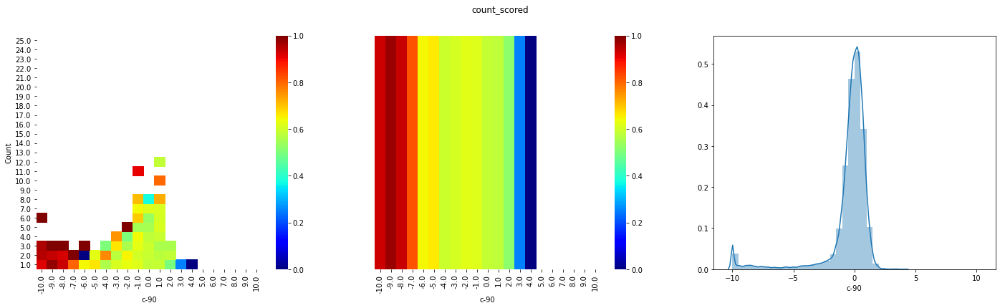

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


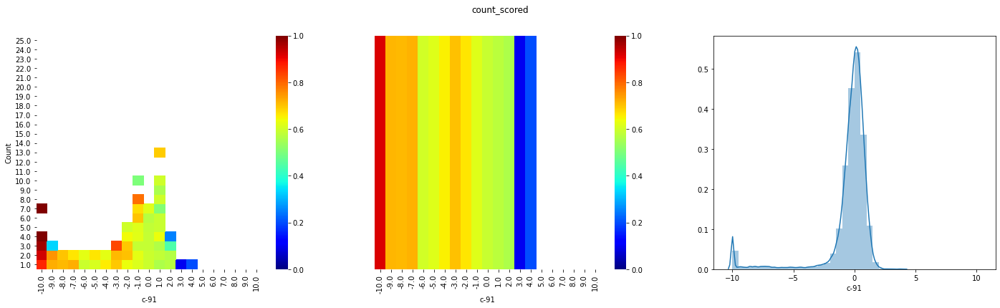

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


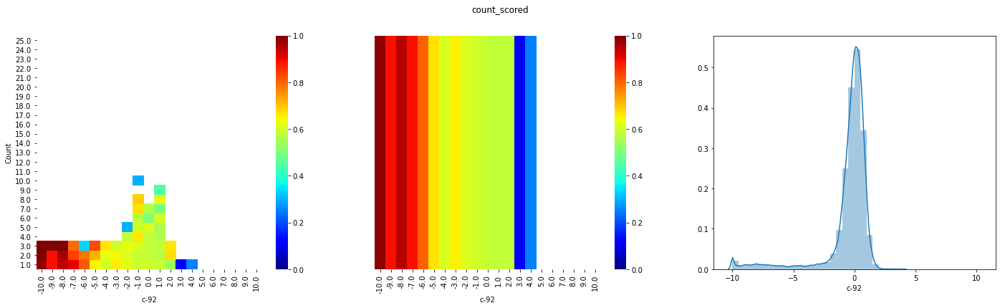

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


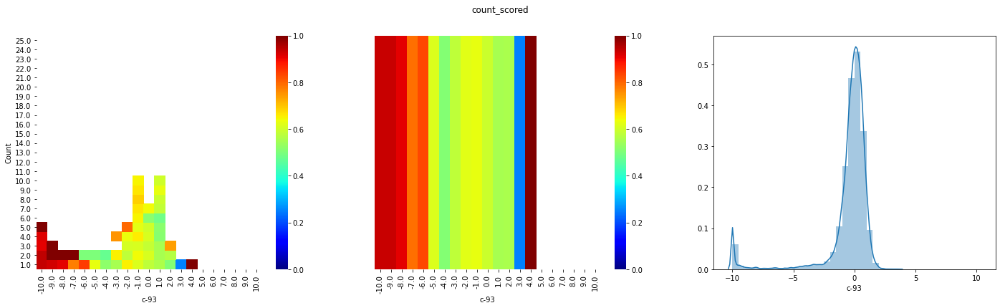

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


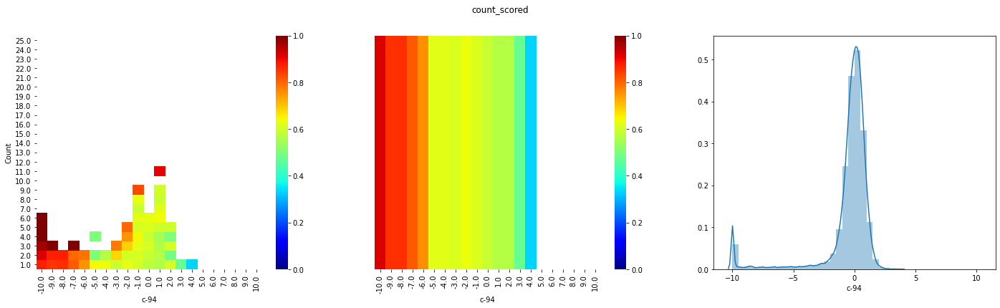

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


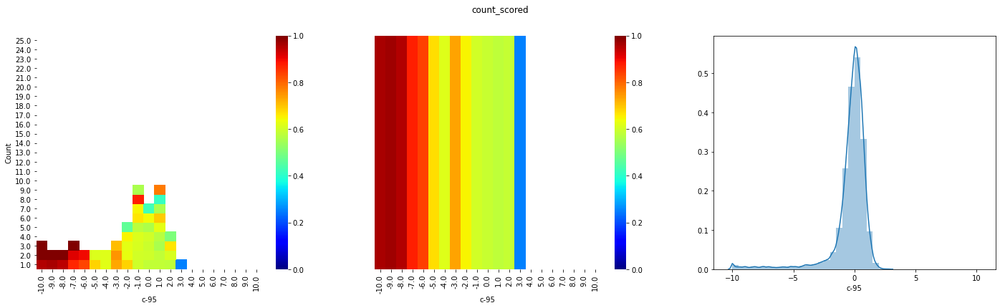

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


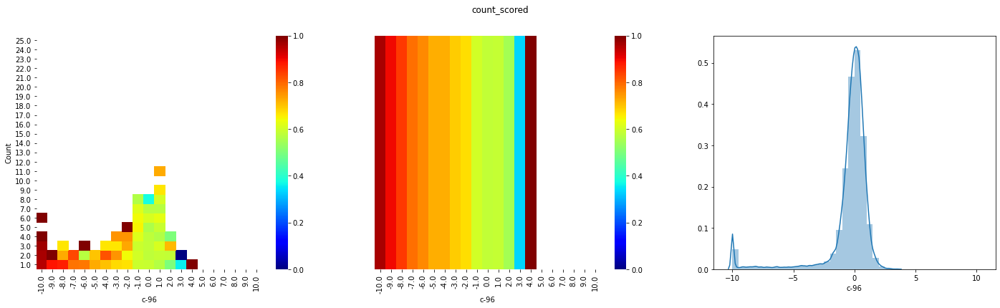

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


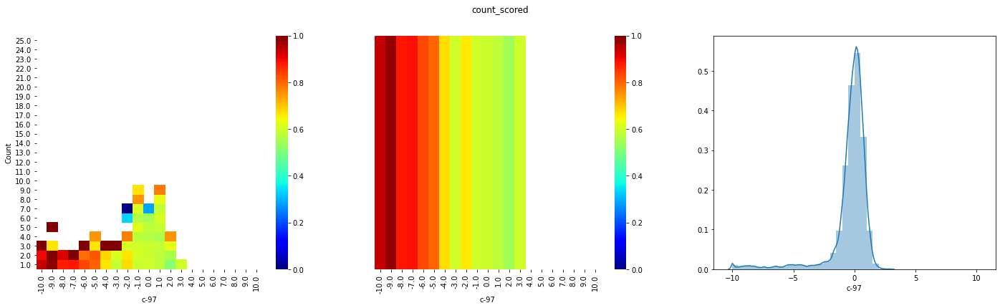

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


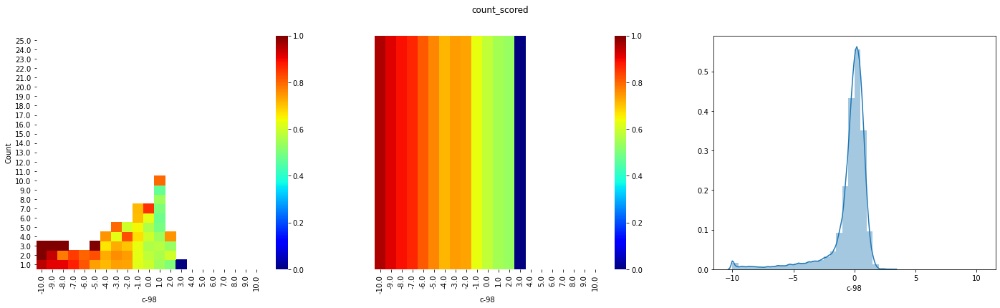

<ipython-input-385-c28a5a7ca07e>:15: RuntimeWarning: invalid value encountered in true_divide
  df_hist1 = pd.DataFrame(H1 / (H0 + H1), index=ymean, columns=xmean)
<ipython-input-385-c28a5a7ca07e>:16: RuntimeWarning: invalid value encountered in true_divide
  df_hist2 = pd.DataFrame(np.tile(H1.sum(axis=0) / (H0 + H1).sum(axis=0), (len(ymean), 1)), index=ymean, columns=xmean)


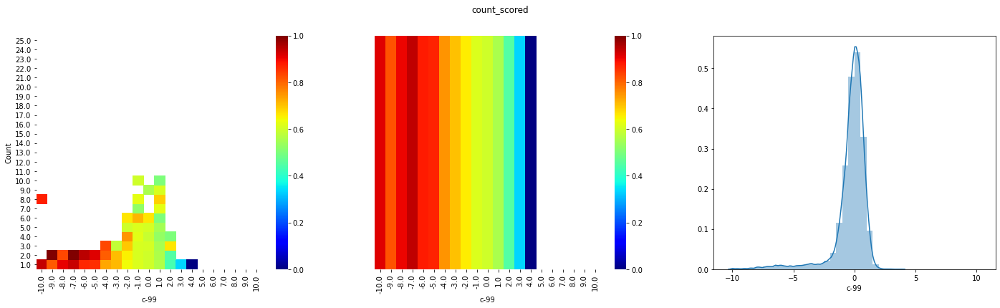

In [387]:
for col in df_full.filter(regex='^c-').columns:
    plot_2dhist(df_full, col, 'count_scored')

1.3933985532184452

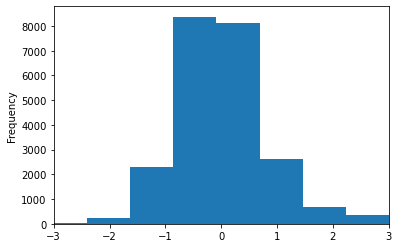

In [372]:
df_full['g-0'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-0'].std()

0.8123634123257786

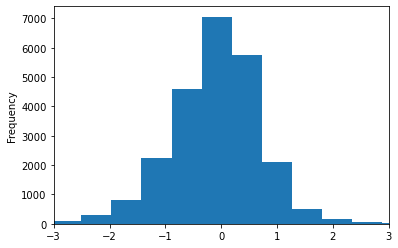

In [371]:
df_full['g-1'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-1'].std()

0.7433006916959266

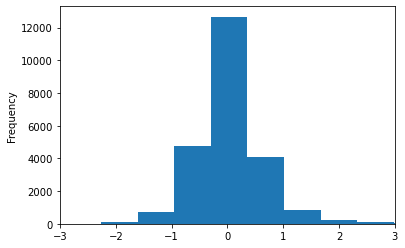

In [373]:
df_full['g-18'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-18'].std()

1.1315344191748518

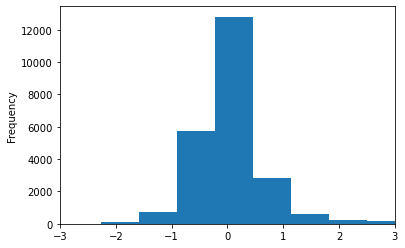

In [374]:
df_full['g-46'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-46'].std()

1.143067979759477

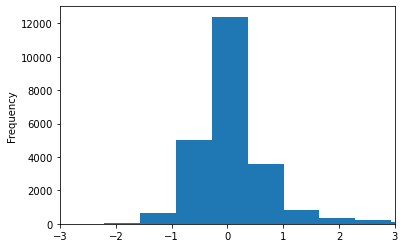

In [375]:
df_full['g-132'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-132'].std()

0.7641113527013046

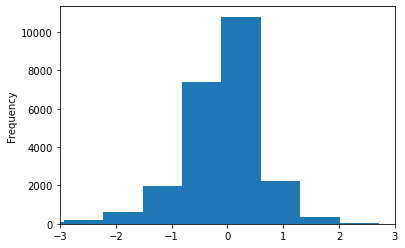

In [376]:
df_full['g-153'].plot(kind='hist', bins=20)
plt.xlim(-3, +3)
df_full['g-153'].std()

for col in df_full.filter(regex='^g-').columns:
    plot_2dhist(df_full, col, 'count_scored')